<a href="https://colab.research.google.com/github/Ibnuamrithaher/Deep-Learning/blob/main/16%20-%20Recurrent%20Neural%20Network/Part%206%20-%20BiLSTM%20with%20PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install "jcopdl==1.1.1"
!pip install "luwiji==1.1.1"

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 44.1 MB/s eta 0:00:00
  Created wheel for jcopdl: filename=jcopdl-1.1.1-py2.py3-none-any.whl size=12587 sha256=2fd4f03462c8277443fb020839364e8f3cb78b86d9292c6bd111c0eac1d01f9c
  Stored 

In [ ]:
!gdown https://drive.google.com/uc?id=1FbwBijisSEymWLhfpP9CDVKm1oAQZ3nc

Downloading...
From: https://drive.google.com/uc?id=1FbwBijisSEymWLhfpP9CDVKm1oAQZ3nc
To: /content/data (4).zip
100% 95.8k/95.8k [00:00<00:00, 56.1MB/s]


In [ ]:
!unzip "data (4).zip"

Archive:  data (4).zip
   creating: data/
  inflating: data/.DS_Store          
  inflating: data/sine_new.csv       
   creating: data/.ipynb_checkpoints/
  inflating: data/jkse.csv           
  inflating: data/daily_min_temp.csv  
  inflating: data/sine.csv           


In [ ]:
from luwiji.rnn import illustration

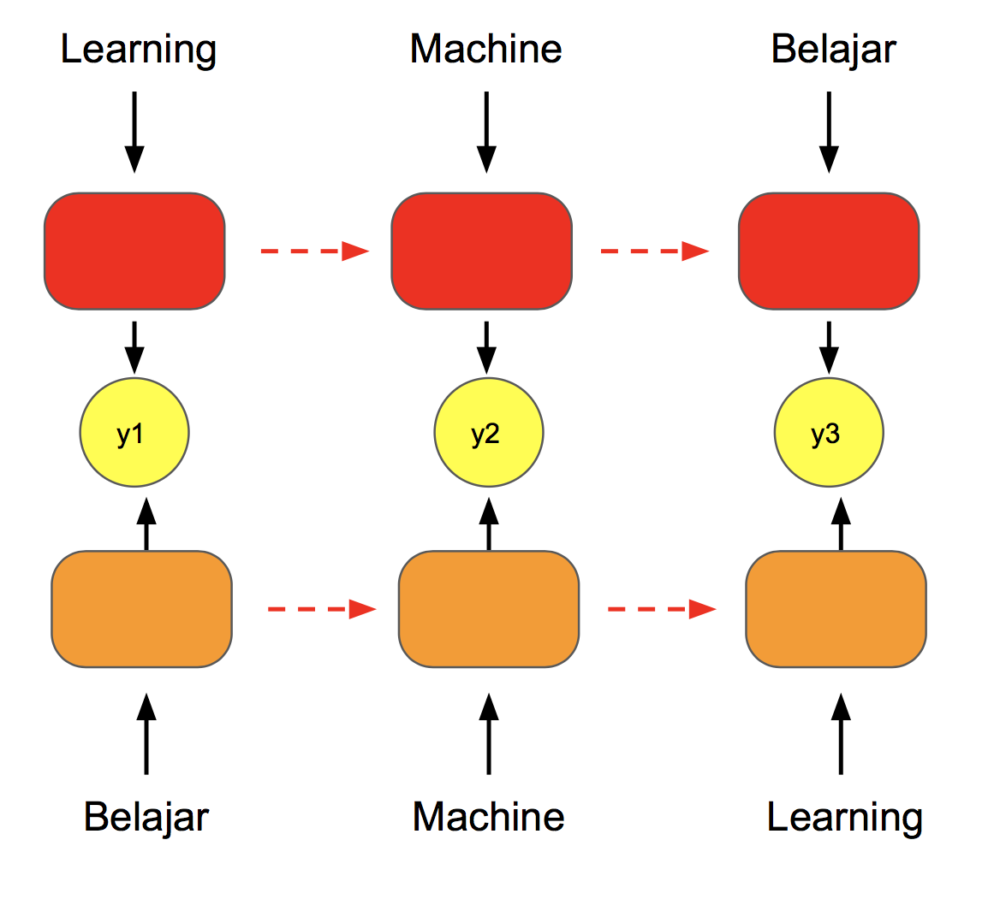

In [ ]:
illustration.blstm

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

In [ ]:
import torch
from torch import nn, optim
from jcopdl.callback import Callback, set_config

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

# Import Data

In [ ]:
df = pd.read_csv("/content/data/daily_min_temp.csv", parse_dates=["Date"],index_col=["Date"])
df.head()

,Temp
Date,
1981-01-01,20.7
1981-01-02,17.9
1981-01-03,18.8
1981-01-04,14.6
1981-01-05,15.8


In [ ]:
df = df.resample("w").mean()

<ipython-input-9-afc0ef0a1da9>:1: FutureWarning: 'w' is deprecated and will be removed in a future version, please use 'W' instead.
  df = df.resample("w").mean()


<Axes: xlabel='Date'>

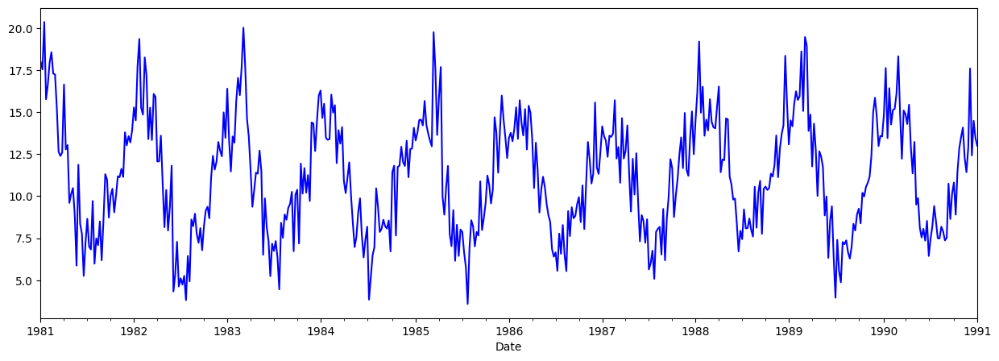

In [ ]:
df.Temp.plot(figsize=(15,5), color='b')

# Dataset Splitting

In [ ]:
ts_train, ts_test= train_test_split(df, test_size=0.2, shuffle=False)
ts_train.shape, ts_test.shape

((418, 1), (105, 1))

# Dataset & Dataloader

In [ ]:
from torch.utils.data import DataLoader
from jcopdl.utils.dataloader import TimeSeriesDataset

In [ ]:
seq_len = 14
bs = 32 # isi batch size
train_set = TimeSeriesDataset(ts_train, "Temp", seq_len)
trainloader = DataLoader(train_set, batch_size=bs, shuffle=True, num_workers=0)

test_set = TimeSeriesDataset(ts_test, "Temp", seq_len)
testloader = DataLoader(test_set, batch_size=bs, shuffle=False)


(N, S, F): (29, 14, 1)
Note: last 11 data excluded

(N, S, F): (7, 14, 1)
Note: last 6 data excluded



# Arsitektur & Config

In [ ]:
from jcopdl.layers import linear_block

In [ ]:
class BiLSTM(nn.Module):
    def __init__(self, input_size, output_size, hidden_size, num_layers,dropout):
        super().__init__()
        self.RNN = nn.LSTM(input_size, hidden_size, num_layers, dropout=dropout, batch_first=True, bidirectional=True)
        self.fc = nn.Linear(2*hidden_size, output_size)
    def forward(self, x, hidden):
        x, hidden = self.RNN(x,hidden)
        x = self.fc(x)
        return x, hidden



In [ ]:
config = set_config({
    "input_size":train_set.n_feature,
    "seq_len":train_set.n_seq,
    "output_size":1,
    "hidden_size":64,
    "num_layers":2,
    "dropout":0,
})

# Training Preparation -> MCOC

In [ ]:
model = BiLSTM(config.input_size, config.output_size, config.hidden_size, config.num_layers, config.dropout).to(device)  # model yang sudah dibuat
criterion = nn.MSELoss(reduction="mean")  # loss function
optimizer = optim.AdamW(model.parameters(), lr=0.00005)
callback = Callback(model, config, outdir="model/train")

# Training

In [ ]:
# Standard Loop
from tqdm.auto import tqdm

def loop_fn(mode, dataset, dataloader, model, criterion, optimizer, device):
    if mode == "train":
        model.train()
    elif mode == "test":
        model.eval()
    cost = 0
    for feature, target in tqdm(dataloader, desc=mode.title()):
        feature, target = feature.to(device), target.to(device)
        output, hidden = model(feature, None)
        loss = criterion(output, target)

        if mode == "train":
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        cost += loss.item() * feature.shape[0]
    cost = cost / len(dataset)
    return cost

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     1
Train_cost  = 135.3414 | Test_cost  = 142.3255 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     2
Train_cost  = 135.1669 | Test_cost  = 142.1443 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     3
Train_cost  = 134.9925 | Test_cost  = 141.9632 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     4
Train_cost  = 134.8182 | Test_cost  = 141.7822 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     5
Train_cost  = 134.6440 | Test_cost  = 141.6012 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     6
Train_cost  = 134.4698 | Test_cost  = 141.4202 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     7
Train_cost  = 134.2956 | Test_cost  = 141.2392 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     8
Train_cost  = 134.1215 | Test_cost  = 141.0582 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch     9
Train_cost  = 133.9473 | Test_cost  = 140.8772 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    10
Train_cost  = 133.7731 | Test_cost  = 140.6961 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    11
Train_cost  = 133.5988 | Test_cost  = 140.5150 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    12
Train_cost  = 133.4245 | Test_cost  = 140.3336 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    13
Train_cost  = 133.2500 | Test_cost  = 140.1522 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    14
Train_cost  = 133.0754 | Test_cost  = 139.9706 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    15
Train_cost  = 132.9006 | Test_cost  = 139.7887 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    16
Train_cost  = 132.7255 | Test_cost  = 139.6067 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    17
Train_cost  = 132.5503 | Test_cost  = 139.4243 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    18
Train_cost  = 132.3748 | Test_cost  = 139.2417 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    19
Train_cost  = 132.1990 | Test_cost  = 139.0586 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    20
Train_cost  = 132.0228 | Test_cost  = 138.8752 | 


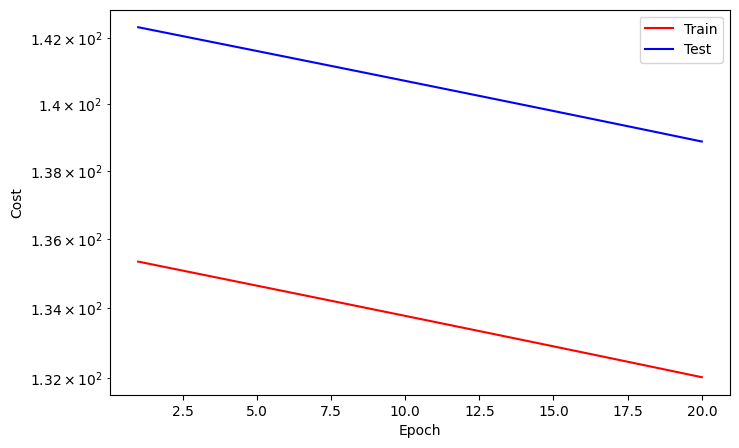

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    21
Train_cost  = 131.8463 | Test_cost  = 138.6913 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    22
Train_cost  = 131.6693 | Test_cost  = 138.5070 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    23
Train_cost  = 131.4918 | Test_cost  = 138.3221 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    24
Train_cost  = 131.3138 | Test_cost  = 138.1367 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    25
Train_cost  = 131.1353 | Test_cost  = 137.9506 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    26
Train_cost  = 130.9561 | Test_cost  = 137.7638 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    27
Train_cost  = 130.7763 | Test_cost  = 137.5763 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    28
Train_cost  = 130.5957 | Test_cost  = 137.3880 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    29
Train_cost  = 130.4144 | Test_cost  = 137.1988 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    30
Train_cost  = 130.2323 | Test_cost  = 137.0088 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    31
Train_cost  = 130.0492 | Test_cost  = 136.8177 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    32
Train_cost  = 129.8653 | Test_cost  = 136.6257 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    33
Train_cost  = 129.6804 | Test_cost  = 136.4327 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    34
Train_cost  = 129.4945 | Test_cost  = 136.2385 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    35
Train_cost  = 129.3074 | Test_cost  = 136.0432 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    36
Train_cost  = 129.1193 | Test_cost  = 135.8466 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    37
Train_cost  = 128.9300 | Test_cost  = 135.6488 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    38
Train_cost  = 128.7394 | Test_cost  = 135.4496 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    39
Train_cost  = 128.5476 | Test_cost  = 135.2491 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    40
Train_cost  = 128.3544 | Test_cost  = 135.0471 | 


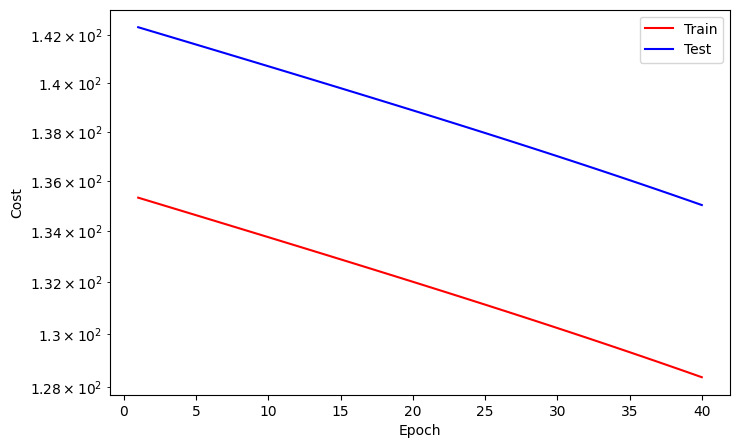

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    41
Train_cost  = 128.1598 | Test_cost  = 134.8436 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    42
Train_cost  = 127.9638 | Test_cost  = 134.6386 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    43
Train_cost  = 127.7663 | Test_cost  = 134.4320 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    44
Train_cost  = 127.5673 | Test_cost  = 134.2238 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    45
Train_cost  = 127.3667 | Test_cost  = 134.0138 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    46
Train_cost  = 127.1644 | Test_cost  = 133.8021 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    47
Train_cost  = 126.9605 | Test_cost  = 133.5885 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    48
Train_cost  = 126.7547 | Test_cost  = 133.3732 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    49
Train_cost  = 126.5472 | Test_cost  = 133.1558 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    50
Train_cost  = 126.3378 | Test_cost  = 132.9365 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    51
Train_cost  = 126.1265 | Test_cost  = 132.7151 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    52
Train_cost  = 125.9132 | Test_cost  = 132.4917 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    53
Train_cost  = 125.6979 | Test_cost  = 132.2660 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    54
Train_cost  = 125.4805 | Test_cost  = 132.0382 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    55
Train_cost  = 125.2610 | Test_cost  = 131.8081 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    56
Train_cost  = 125.0393 | Test_cost  = 131.5756 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    57
Train_cost  = 124.8153 | Test_cost  = 131.3408 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    58
Train_cost  = 124.5890 | Test_cost  = 131.1035 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    59
Train_cost  = 124.3603 | Test_cost  = 130.8637 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    60
Train_cost  = 124.1292 | Test_cost  = 130.6213 | 


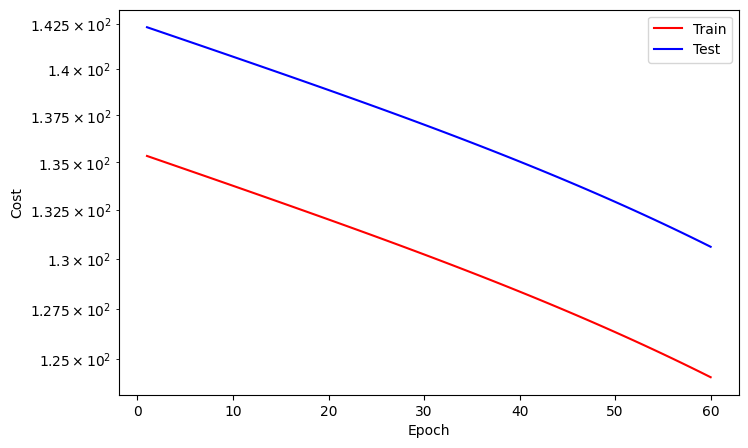

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    61
Train_cost  = 123.8957 | Test_cost  = 130.3763 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    62
Train_cost  = 123.6595 | Test_cost  = 130.1285 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    63
Train_cost  = 123.4208 | Test_cost  = 129.8780 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    64
Train_cost  = 123.1794 | Test_cost  = 129.6247 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    65
Train_cost  = 122.9353 | Test_cost  = 129.3685 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    66
Train_cost  = 122.6883 | Test_cost  = 129.1093 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    67
Train_cost  = 122.4386 | Test_cost  = 128.8471 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    68
Train_cost  = 122.1859 | Test_cost  = 128.5819 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    69
Train_cost  = 121.9303 | Test_cost  = 128.3135 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    70
Train_cost  = 121.6716 | Test_cost  = 128.0418 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    71
Train_cost  = 121.4098 | Test_cost  = 127.7670 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    72
Train_cost  = 121.1448 | Test_cost  = 127.4887 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    73
Train_cost  = 120.8767 | Test_cost  = 127.2071 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    74
Train_cost  = 120.6052 | Test_cost  = 126.9220 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    75
Train_cost  = 120.3304 | Test_cost  = 126.6334 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    76
Train_cost  = 120.0522 | Test_cost  = 126.3411 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    77
Train_cost  = 119.7705 | Test_cost  = 126.0452 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    78
Train_cost  = 119.4853 | Test_cost  = 125.7456 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    79
Train_cost  = 119.1965 | Test_cost  = 125.4422 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    80
Train_cost  = 118.9040 | Test_cost  = 125.1349 | 


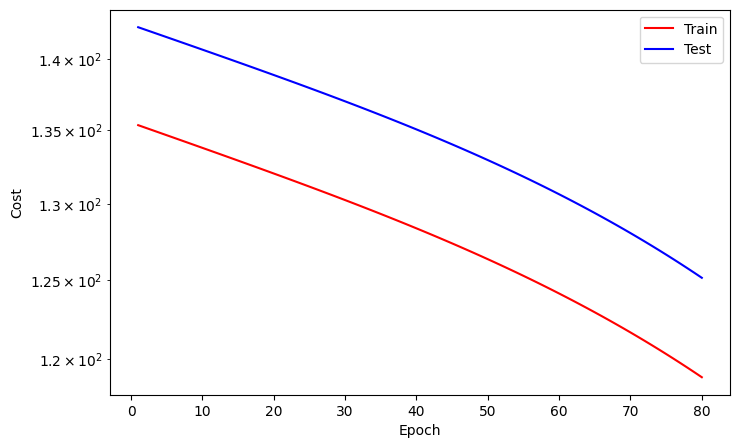

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    81
Train_cost  = 118.6078 | Test_cost  = 124.8237 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    82
Train_cost  = 118.3078 | Test_cost  = 124.5085 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    83
Train_cost  = 118.0039 | Test_cost  = 124.1893 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    84
Train_cost  = 117.6962 | Test_cost  = 123.8660 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    85
Train_cost  = 117.3844 | Test_cost  = 123.5385 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    86
Train_cost  = 117.0687 | Test_cost  = 123.2068 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    87
Train_cost  = 116.7489 | Test_cost  = 122.8708 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    88
Train_cost  = 116.4249 | Test_cost  = 122.5304 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    89
Train_cost  = 116.0968 | Test_cost  = 122.1857 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    90
Train_cost  = 115.7644 | Test_cost  = 121.8366 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    91
Train_cost  = 115.4277 | Test_cost  = 121.4829 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    92
Train_cost  = 115.0867 | Test_cost  = 121.1247 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    93
Train_cost  = 114.7413 | Test_cost  = 120.7619 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    94
Train_cost  = 114.3914 | Test_cost  = 120.3945 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    95
Train_cost  = 114.0371 | Test_cost  = 120.0224 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    96
Train_cost  = 113.6782 | Test_cost  = 119.6456 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    97
Train_cost  = 113.3148 | Test_cost  = 119.2641 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    98
Train_cost  = 112.9468 | Test_cost  = 118.8778 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch    99
Train_cost  = 112.5742 | Test_cost  = 118.4867 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   100
Train_cost  = 112.1970 | Test_cost  = 118.0908 | 


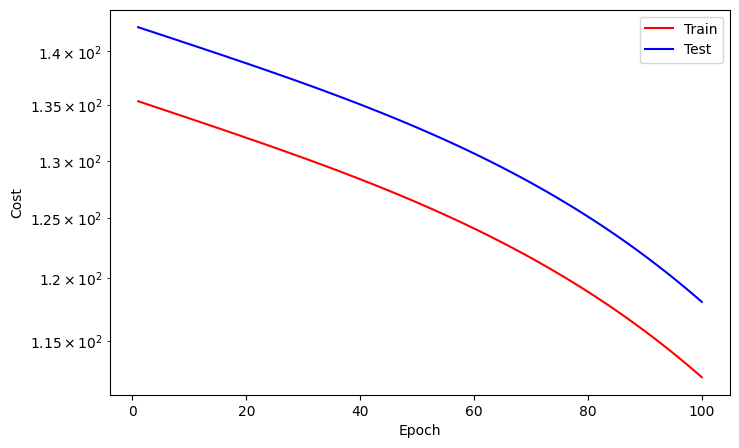

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   101
Train_cost  = 111.8150 | Test_cost  = 117.6900 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   102
Train_cost  = 111.4285 | Test_cost  = 117.2844 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   103
Train_cost  = 111.0371 | Test_cost  = 116.8740 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   104
Train_cost  = 110.6411 | Test_cost  = 116.4586 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   105
Train_cost  = 110.2404 | Test_cost  = 116.0384 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   106
Train_cost  = 109.8349 | Test_cost  = 115.6133 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   107
Train_cost  = 109.4247 | Test_cost  = 115.1834 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   108
Train_cost  = 109.0098 | Test_cost  = 114.7486 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   109
Train_cost  = 108.5903 | Test_cost  = 114.3090 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   110
Train_cost  = 108.1660 | Test_cost  = 113.8645 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   111
Train_cost  = 107.7371 | Test_cost  = 113.4153 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   112
Train_cost  = 107.3035 | Test_cost  = 112.9614 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   113
Train_cost  = 106.8654 | Test_cost  = 112.5028 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   114
Train_cost  = 106.4227 | Test_cost  = 112.0396 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   115
Train_cost  = 105.9755 | Test_cost  = 111.5718 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   116
Train_cost  = 105.5239 | Test_cost  = 111.0994 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   117
Train_cost  = 105.0679 | Test_cost  = 110.6227 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   118
Train_cost  = 104.6076 | Test_cost  = 110.1416 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   119
Train_cost  = 104.1430 | Test_cost  = 109.6562 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   120
Train_cost  = 103.6743 | Test_cost  = 109.1666 | 


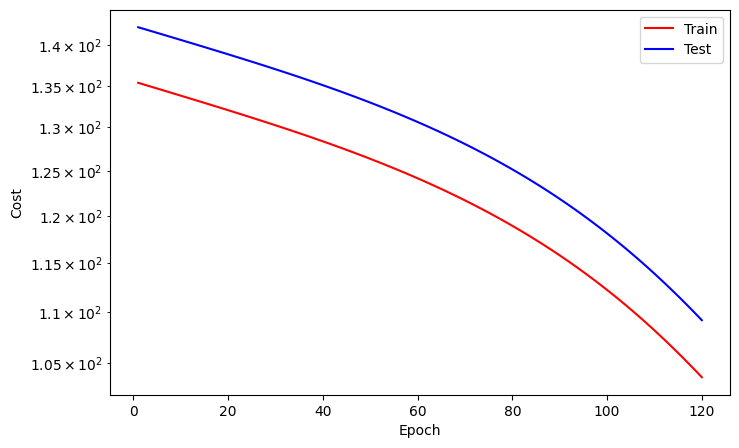

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   121
Train_cost  = 103.2016 | Test_cost  = 108.6730 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   122
Train_cost  = 102.7248 | Test_cost  = 108.1753 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   123
Train_cost  = 102.2443 | Test_cost  = 107.6739 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   124
Train_cost  = 101.7599 | Test_cost  = 107.1686 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   125
Train_cost  = 101.2720 | Test_cost  = 106.6598 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   126
Train_cost  = 100.7805 | Test_cost  = 106.1475 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   127
Train_cost  = 100.2857 | Test_cost  = 105.6319 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   128
Train_cost  = 99.7877 | Test_cost  = 105.1131 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   129
Train_cost  = 99.2865 | Test_cost  = 104.5913 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   130
Train_cost  = 98.7824 | Test_cost  = 104.0665 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   131
Train_cost  = 98.2755 | Test_cost  = 103.5391 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   132
Train_cost  = 97.7660 | Test_cost  = 103.0092 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   133
Train_cost  = 97.2540 | Test_cost  = 102.4769 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   134
Train_cost  = 96.7398 | Test_cost  = 101.9424 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   135
Train_cost  = 96.2234 | Test_cost  = 101.4059 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   136
Train_cost  = 95.7050 | Test_cost  = 100.8675 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   137
Train_cost  = 95.1849 | Test_cost  = 100.3276 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   138
Train_cost  = 94.6633 | Test_cost  = 99.7862 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   139
Train_cost  = 94.1402 | Test_cost  = 99.2435 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   140
Train_cost  = 93.6159 | Test_cost  = 98.6997 | 


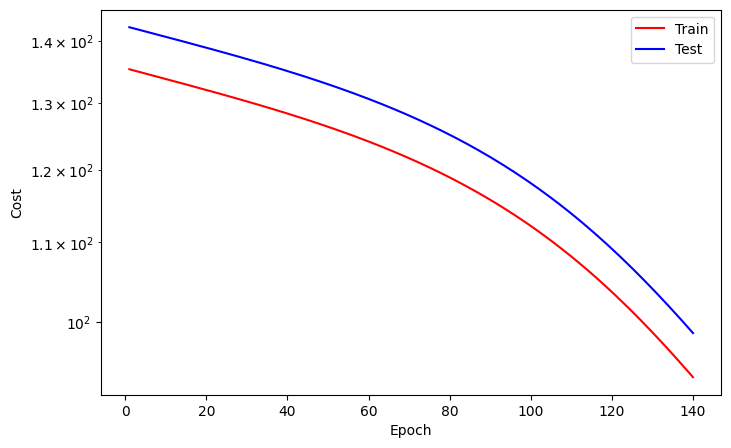

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   141
Train_cost  = 93.0905 | Test_cost  = 98.1551 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   142
Train_cost  = 92.5644 | Test_cost  = 97.6098 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   143
Train_cost  = 92.0375 | Test_cost  = 97.0639 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   144
Train_cost  = 91.5102 | Test_cost  = 96.5178 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   145
Train_cost  = 90.9825 | Test_cost  = 95.9715 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   146
Train_cost  = 90.4548 | Test_cost  = 95.4252 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   147
Train_cost  = 89.9271 | Test_cost  = 94.8791 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   148
Train_cost  = 89.3996 | Test_cost  = 94.3335 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   149
Train_cost  = 88.8725 | Test_cost  = 93.7884 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   150
Train_cost  = 88.3460 | Test_cost  = 93.2440 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   151
Train_cost  = 87.8202 | Test_cost  = 92.7005 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   152
Train_cost  = 87.2952 | Test_cost  = 92.1580 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   153
Train_cost  = 86.7713 | Test_cost  = 91.6168 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   154
Train_cost  = 86.2486 | Test_cost  = 91.0768 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   155
Train_cost  = 85.7272 | Test_cost  = 90.5384 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   156
Train_cost  = 85.2073 | Test_cost  = 90.0015 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   157
Train_cost  = 84.6889 | Test_cost  = 89.4663 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   158
Train_cost  = 84.1722 | Test_cost  = 88.9330 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   159
Train_cost  = 83.6574 | Test_cost  = 88.4017 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   160
Train_cost  = 83.1445 | Test_cost  = 87.8725 | 


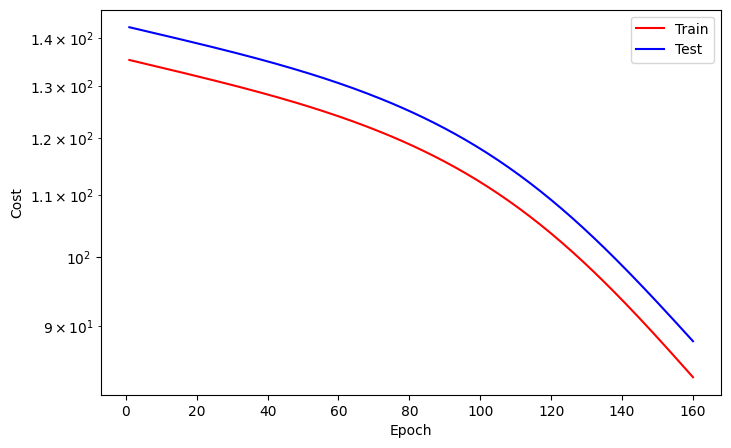

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   161
Train_cost  = 82.6337 | Test_cost  = 87.3455 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   162
Train_cost  = 82.1250 | Test_cost  = 86.8207 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   163
Train_cost  = 81.6186 | Test_cost  = 86.2984 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   164
Train_cost  = 81.1145 | Test_cost  = 85.7785 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   165
Train_cost  = 80.6130 | Test_cost  = 85.2612 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   166
Train_cost  = 80.1139 | Test_cost  = 84.7466 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   167
Train_cost  = 79.6175 | Test_cost  = 84.2347 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   168
Train_cost  = 79.1237 | Test_cost  = 83.7256 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   169
Train_cost  = 78.6328 | Test_cost  = 83.2194 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   170
Train_cost  = 78.1447 | Test_cost  = 82.7162 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   171
Train_cost  = 77.6594 | Test_cost  = 82.2160 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   172
Train_cost  = 77.1772 | Test_cost  = 81.7189 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   173
Train_cost  = 76.6980 | Test_cost  = 81.2249 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   174
Train_cost  = 76.2219 | Test_cost  = 80.7341 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   175
Train_cost  = 75.7490 | Test_cost  = 80.2466 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   176
Train_cost  = 75.2792 | Test_cost  = 79.7624 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   177
Train_cost  = 74.8127 | Test_cost  = 79.2814 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   178
Train_cost  = 74.3495 | Test_cost  = 78.8039 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   179
Train_cost  = 73.8896 | Test_cost  = 78.3298 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   180
Train_cost  = 73.4330 | Test_cost  = 77.8591 | 


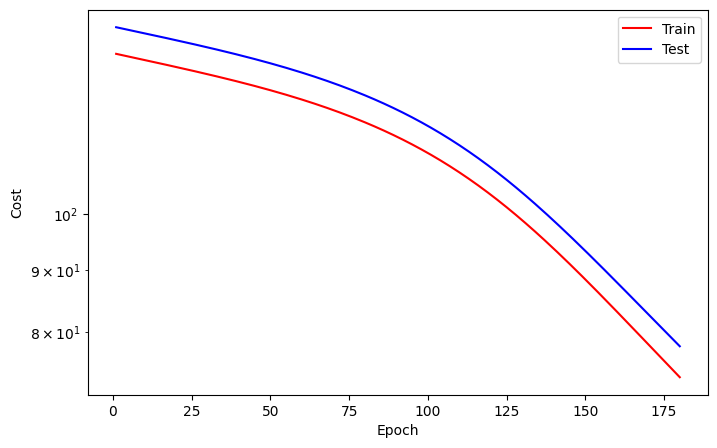

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   181
Train_cost  = 72.9799 | Test_cost  = 77.3919 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   182
Train_cost  = 72.5301 | Test_cost  = 76.9282 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   183
Train_cost  = 72.0838 | Test_cost  = 76.4680 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   184
Train_cost  = 71.6410 | Test_cost  = 76.0114 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   185
Train_cost  = 71.2016 | Test_cost  = 75.5583 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   186
Train_cost  = 70.7658 | Test_cost  = 75.1087 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   187
Train_cost  = 70.3334 | Test_cost  = 74.6628 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   188
Train_cost  = 69.9045 | Test_cost  = 74.2204 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   189
Train_cost  = 69.4792 | Test_cost  = 73.7816 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   190
Train_cost  = 69.0574 | Test_cost  = 73.3463 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   191
Train_cost  = 68.6390 | Test_cost  = 72.9147 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   192
Train_cost  = 68.2242 | Test_cost  = 72.4865 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   193
Train_cost  = 67.8129 | Test_cost  = 72.0620 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   194
Train_cost  = 67.4051 | Test_cost  = 71.6410 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   195
Train_cost  = 67.0007 | Test_cost  = 71.2236 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   196
Train_cost  = 66.5999 | Test_cost  = 70.8096 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   197
Train_cost  = 66.2024 | Test_cost  = 70.3992 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   198
Train_cost  = 65.8084 | Test_cost  = 69.9922 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   199
Train_cost  = 65.4178 | Test_cost  = 69.5887 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   200
Train_cost  = 65.0306 | Test_cost  = 69.1887 | 


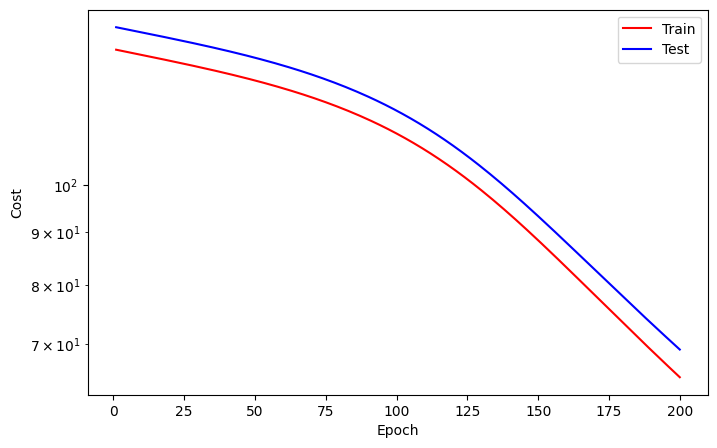

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   201
Train_cost  = 64.6468 | Test_cost  = 68.7921 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   202
Train_cost  = 64.2663 | Test_cost  = 68.3989 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   203
Train_cost  = 63.8892 | Test_cost  = 68.0090 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   204
Train_cost  = 63.5153 | Test_cost  = 67.6225 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   205
Train_cost  = 63.1447 | Test_cost  = 67.2394 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   206
Train_cost  = 62.7774 | Test_cost  = 66.8595 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   207
Train_cost  = 62.4133 | Test_cost  = 66.4829 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   208
Train_cost  = 62.0524 | Test_cost  = 66.1096 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   209
Train_cost  = 61.6947 | Test_cost  = 65.7395 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   210
Train_cost  = 61.3401 | Test_cost  = 65.3726 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   211
Train_cost  = 60.9887 | Test_cost  = 65.0088 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   212
Train_cost  = 60.6403 | Test_cost  = 64.6481 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   213
Train_cost  = 60.2950 | Test_cost  = 64.2906 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   214
Train_cost  = 59.9526 | Test_cost  = 63.9361 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   215
Train_cost  = 59.6133 | Test_cost  = 63.5846 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   216
Train_cost  = 59.2769 | Test_cost  = 63.2362 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   217
Train_cost  = 58.9435 | Test_cost  = 62.8907 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   218
Train_cost  = 58.6129 | Test_cost  = 62.5481 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   219
Train_cost  = 58.2852 | Test_cost  = 62.2084 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   220
Train_cost  = 57.9603 | Test_cost  = 61.8715 | 


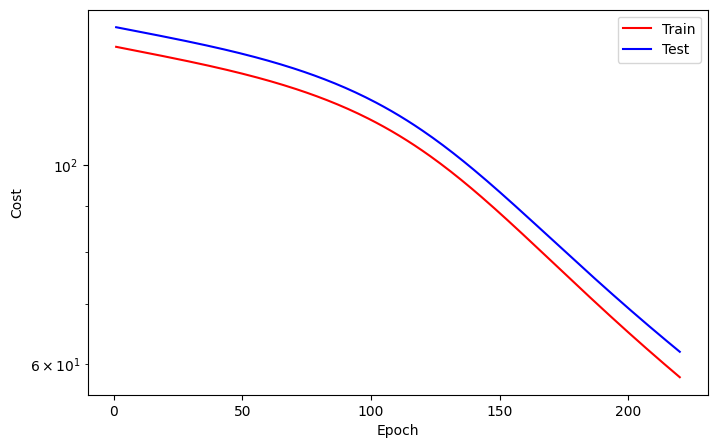

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   221
Train_cost  = 57.6381 | Test_cost  = 61.5374 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   222
Train_cost  = 57.3188 | Test_cost  = 61.2062 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   223
Train_cost  = 57.0021 | Test_cost  = 60.8776 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   224
Train_cost  = 56.6880 | Test_cost  = 60.5518 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   225
Train_cost  = 56.3767 | Test_cost  = 60.2287 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   226
Train_cost  = 56.0679 | Test_cost  = 59.9081 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   227
Train_cost  = 55.7617 | Test_cost  = 59.5902 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   228
Train_cost  = 55.4580 | Test_cost  = 59.2748 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   229
Train_cost  = 55.1567 | Test_cost  = 58.9620 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   230
Train_cost  = 54.8580 | Test_cost  = 58.6516 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   231
Train_cost  = 54.5617 | Test_cost  = 58.3437 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   232
Train_cost  = 54.2678 | Test_cost  = 58.0382 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   233
Train_cost  = 53.9762 | Test_cost  = 57.7351 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   234
Train_cost  = 53.6870 | Test_cost  = 57.4344 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   235
Train_cost  = 53.4001 | Test_cost  = 57.1360 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   236
Train_cost  = 53.1154 | Test_cost  = 56.8400 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   237
Train_cost  = 52.8330 | Test_cost  = 56.5462 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   238
Train_cost  = 52.5528 | Test_cost  = 56.2547 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   239
Train_cost  = 52.2749 | Test_cost  = 55.9654 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   240
Train_cost  = 51.9991 | Test_cost  = 55.6783 | 


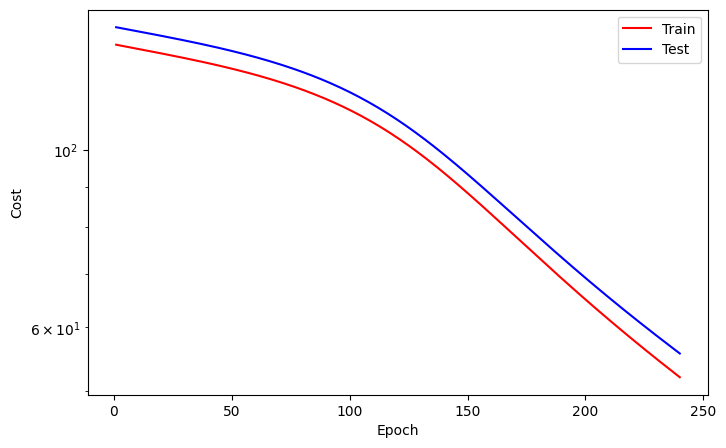

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   241
Train_cost  = 51.7254 | Test_cost  = 55.3934 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   242
Train_cost  = 51.4539 | Test_cost  = 55.1107 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   243
Train_cost  = 51.1846 | Test_cost  = 54.8302 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   244
Train_cost  = 50.9173 | Test_cost  = 54.5518 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   245
Train_cost  = 50.6521 | Test_cost  = 54.2755 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   246
Train_cost  = 50.3889 | Test_cost  = 54.0014 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   247
Train_cost  = 50.1279 | Test_cost  = 53.7293 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   248
Train_cost  = 49.8688 | Test_cost  = 53.4594 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   249
Train_cost  = 49.6118 | Test_cost  = 53.1915 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   250
Train_cost  = 49.3568 | Test_cost  = 52.9257 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   251
Train_cost  = 49.1039 | Test_cost  = 52.6619 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   252
Train_cost  = 48.8529 | Test_cost  = 52.4002 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   253
Train_cost  = 48.6039 | Test_cost  = 52.1405 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   254
Train_cost  = 48.3568 | Test_cost  = 51.8828 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   255
Train_cost  = 48.1118 | Test_cost  = 51.6271 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   256
Train_cost  = 47.8686 | Test_cost  = 51.3735 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   257
Train_cost  = 47.6275 | Test_cost  = 51.1218 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   258
Train_cost  = 47.3882 | Test_cost  = 50.8722 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   259
Train_cost  = 47.1509 | Test_cost  = 50.6245 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   260
Train_cost  = 46.9155 | Test_cost  = 50.3788 | 


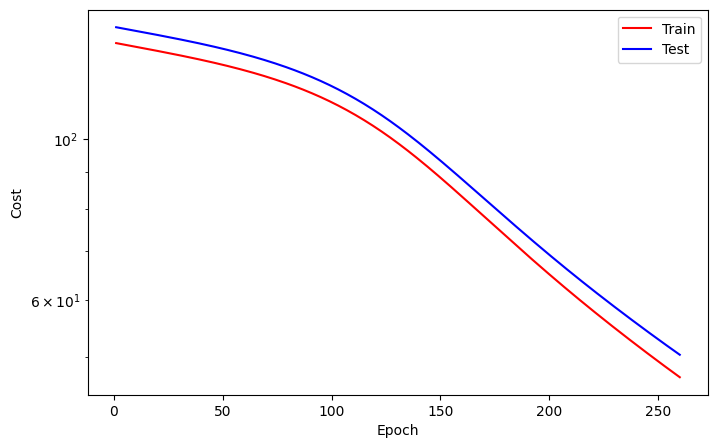

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   261
Train_cost  = 46.6820 | Test_cost  = 50.1350 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   262
Train_cost  = 46.4505 | Test_cost  = 49.8931 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   263
Train_cost  = 46.2207 | Test_cost  = 49.6532 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   264
Train_cost  = 45.9929 | Test_cost  = 49.4152 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   265
Train_cost  = 45.7669 | Test_cost  = 49.1791 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   266
Train_cost  = 45.5427 | Test_cost  = 48.9449 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   267
Train_cost  = 45.3203 | Test_cost  = 48.7126 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   268
Train_cost  = 45.0998 | Test_cost  = 48.4821 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   269
Train_cost  = 44.8811 | Test_cost  = 48.2534 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   270
Train_cost  = 44.6641 | Test_cost  = 48.0265 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   271
Train_cost  = 44.4488 | Test_cost  = 47.8015 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   272
Train_cost  = 44.2354 | Test_cost  = 47.5782 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   273
Train_cost  = 44.0236 | Test_cost  = 47.3567 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   274
Train_cost  = 43.8136 | Test_cost  = 47.1370 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   275
Train_cost  = 43.6052 | Test_cost  = 46.9189 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   276
Train_cost  = 43.3985 | Test_cost  = 46.7026 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   277
Train_cost  = 43.1935 | Test_cost  = 46.4880 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   278
Train_cost  = 42.9900 | Test_cost  = 46.2750 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   279
Train_cost  = 42.7882 | Test_cost  = 46.0637 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   280
Train_cost  = 42.5880 | Test_cost  = 45.8541 | 


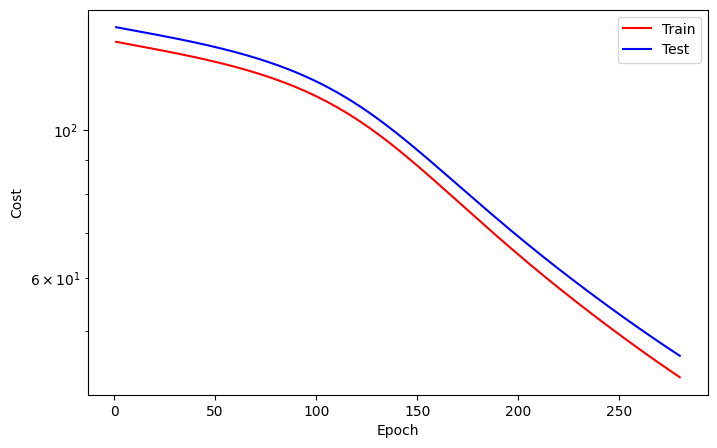

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   281
Train_cost  = 42.3894 | Test_cost  = 45.6460 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   282
Train_cost  = 42.1924 | Test_cost  = 45.4396 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   283
Train_cost  = 41.9969 | Test_cost  = 45.2348 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   284
Train_cost  = 41.8029 | Test_cost  = 45.0315 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   285
Train_cost  = 41.6105 | Test_cost  = 44.8298 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   286
Train_cost  = 41.4195 | Test_cost  = 44.6296 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   287
Train_cost  = 41.2301 | Test_cost  = 44.4310 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   288
Train_cost  = 41.0421 | Test_cost  = 44.2339 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   289
Train_cost  = 40.8556 | Test_cost  = 44.0383 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   290
Train_cost  = 40.6706 | Test_cost  = 43.8442 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   291
Train_cost  = 40.4870 | Test_cost  = 43.6516 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   292
Train_cost  = 40.3049 | Test_cost  = 43.4605 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   293
Train_cost  = 40.1242 | Test_cost  = 43.2708 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   294
Train_cost  = 39.9449 | Test_cost  = 43.0826 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   295
Train_cost  = 39.7670 | Test_cost  = 42.8959 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   296
Train_cost  = 39.5905 | Test_cost  = 42.7106 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   297
Train_cost  = 39.4154 | Test_cost  = 42.5268 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   298
Train_cost  = 39.2416 | Test_cost  = 42.3443 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   299
Train_cost  = 39.0693 | Test_cost  = 42.1633 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   300
Train_cost  = 38.8983 | Test_cost  = 41.9838 | 


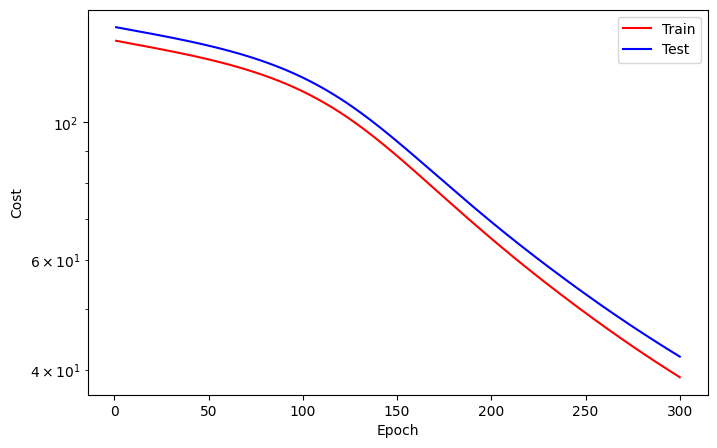

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   301
Train_cost  = 38.7287 | Test_cost  = 41.8056 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   302
Train_cost  = 38.5605 | Test_cost  = 41.6288 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   303
Train_cost  = 38.3936 | Test_cost  = 41.4534 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   304
Train_cost  = 38.2280 | Test_cost  = 41.2795 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   305
Train_cost  = 38.0638 | Test_cost  = 41.1069 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   306
Train_cost  = 37.9009 | Test_cost  = 40.9356 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   307
Train_cost  = 37.7394 | Test_cost  = 40.7658 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   308
Train_cost  = 37.5791 | Test_cost  = 40.5973 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   309
Train_cost  = 37.4201 | Test_cost  = 40.4301 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   310
Train_cost  = 37.2625 | Test_cost  = 40.2643 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   311
Train_cost  = 37.1061 | Test_cost  = 40.0999 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   312
Train_cost  = 36.9510 | Test_cost  = 39.9368 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   313
Train_cost  = 36.7972 | Test_cost  = 39.7749 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   314
Train_cost  = 36.6446 | Test_cost  = 39.6144 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   315
Train_cost  = 36.4934 | Test_cost  = 39.4553 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   316
Train_cost  = 36.3433 | Test_cost  = 39.2974 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   317
Train_cost  = 36.1945 | Test_cost  = 39.1407 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   318
Train_cost  = 36.0469 | Test_cost  = 38.9854 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   319
Train_cost  = 35.9005 | Test_cost  = 38.8313 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   320
Train_cost  = 35.7554 | Test_cost  = 38.6785 | 


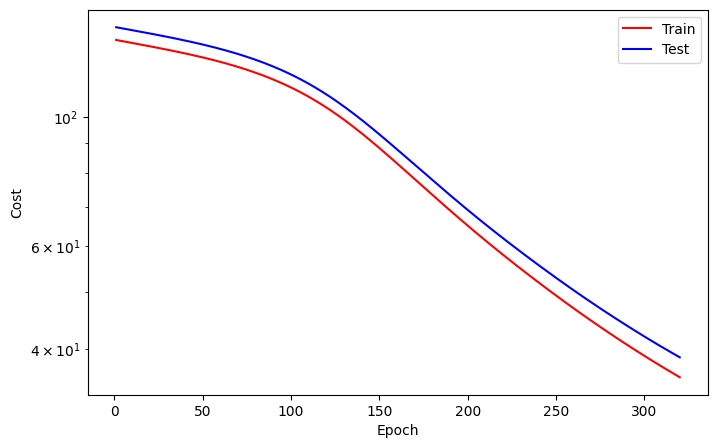

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   321
Train_cost  = 35.6114 | Test_cost  = 38.5270 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   322
Train_cost  = 35.4686 | Test_cost  = 38.3766 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   323
Train_cost  = 35.3270 | Test_cost  = 38.2275 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   324
Train_cost  = 35.1866 | Test_cost  = 38.0797 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   325
Train_cost  = 35.0473 | Test_cost  = 37.9330 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   326
Train_cost  = 34.9092 | Test_cost  = 37.7875 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   327
Train_cost  = 34.7722 | Test_cost  = 37.6432 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   328
Train_cost  = 34.6364 | Test_cost  = 37.5001 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   329
Train_cost  = 34.5017 | Test_cost  = 37.3582 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   330
Train_cost  = 34.3681 | Test_cost  = 37.2174 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   331
Train_cost  = 34.2355 | Test_cost  = 37.0778 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   332
Train_cost  = 34.1041 | Test_cost  = 36.9393 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   333
Train_cost  = 33.9738 | Test_cost  = 36.8019 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   334
Train_cost  = 33.8445 | Test_cost  = 36.6657 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   335
Train_cost  = 33.7163 | Test_cost  = 36.5306 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   336
Train_cost  = 33.5892 | Test_cost  = 36.3965 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   337
Train_cost  = 33.4630 | Test_cost  = 36.2636 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   338
Train_cost  = 33.3380 | Test_cost  = 36.1317 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   339
Train_cost  = 33.2139 | Test_cost  = 36.0009 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   340
Train_cost  = 33.0908 | Test_cost  = 35.8711 | 


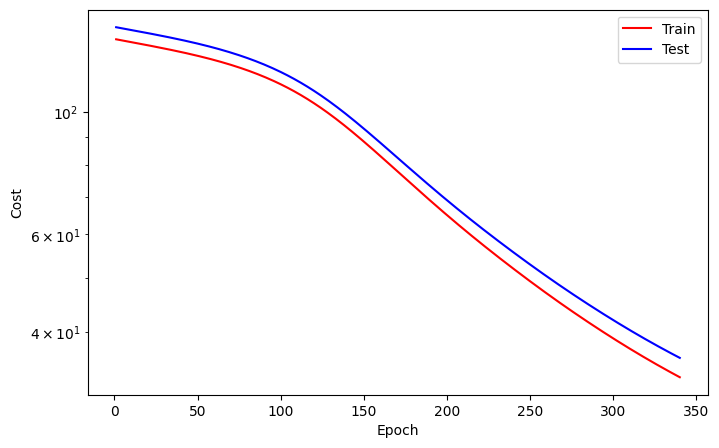

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   341
Train_cost  = 32.9688 | Test_cost  = 35.7424 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   342
Train_cost  = 32.8477 | Test_cost  = 35.6147 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   343
Train_cost  = 32.7276 | Test_cost  = 35.4880 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   344
Train_cost  = 32.6085 | Test_cost  = 35.3624 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   345
Train_cost  = 32.4904 | Test_cost  = 35.2377 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   346
Train_cost  = 32.3732 | Test_cost  = 35.1141 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   347
Train_cost  = 32.2569 | Test_cost  = 34.9914 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   348
Train_cost  = 32.1416 | Test_cost  = 34.8697 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   349
Train_cost  = 32.0272 | Test_cost  = 34.7490 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   350
Train_cost  = 31.9137 | Test_cost  = 34.6292 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   351
Train_cost  = 31.8012 | Test_cost  = 34.5104 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   352
Train_cost  = 31.6895 | Test_cost  = 34.3925 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   353
Train_cost  = 31.5787 | Test_cost  = 34.2755 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   354
Train_cost  = 31.4687 | Test_cost  = 34.1594 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   355
Train_cost  = 31.3597 | Test_cost  = 34.0443 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   356
Train_cost  = 31.2515 | Test_cost  = 33.9300 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   357
Train_cost  = 31.1441 | Test_cost  = 33.8166 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   358
Train_cost  = 31.0376 | Test_cost  = 33.7041 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   359
Train_cost  = 30.9319 | Test_cost  = 33.5924 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   360
Train_cost  = 30.8271 | Test_cost  = 33.4816 | 


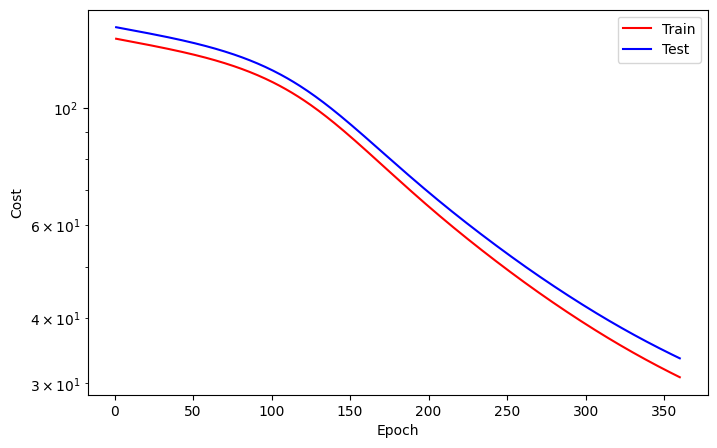

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   361
Train_cost  = 30.7230 | Test_cost  = 33.3717 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   362
Train_cost  = 30.6198 | Test_cost  = 33.2626 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   363
Train_cost  = 30.5173 | Test_cost  = 33.1543 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   364
Train_cost  = 30.4156 | Test_cost  = 33.0468 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   365
Train_cost  = 30.3147 | Test_cost  = 32.9402 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   366
Train_cost  = 30.2146 | Test_cost  = 32.8343 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   367
Train_cost  = 30.1152 | Test_cost  = 32.7293 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   368
Train_cost  = 30.0166 | Test_cost  = 32.6250 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   369
Train_cost  = 29.9188 | Test_cost  = 32.5215 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   370
Train_cost  = 29.8216 | Test_cost  = 32.4188 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   371
Train_cost  = 29.7252 | Test_cost  = 32.3168 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   372
Train_cost  = 29.6295 | Test_cost  = 32.2155 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   373
Train_cost  = 29.5345 | Test_cost  = 32.1151 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   374
Train_cost  = 29.4403 | Test_cost  = 32.0153 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   375
Train_cost  = 29.3467 | Test_cost  = 31.9163 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   376
Train_cost  = 29.2538 | Test_cost  = 31.8180 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   377
Train_cost  = 29.1616 | Test_cost  = 31.7204 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   378
Train_cost  = 29.0700 | Test_cost  = 31.6235 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   379
Train_cost  = 28.9792 | Test_cost  = 31.5273 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   380
Train_cost  = 28.8889 | Test_cost  = 31.4317 | 


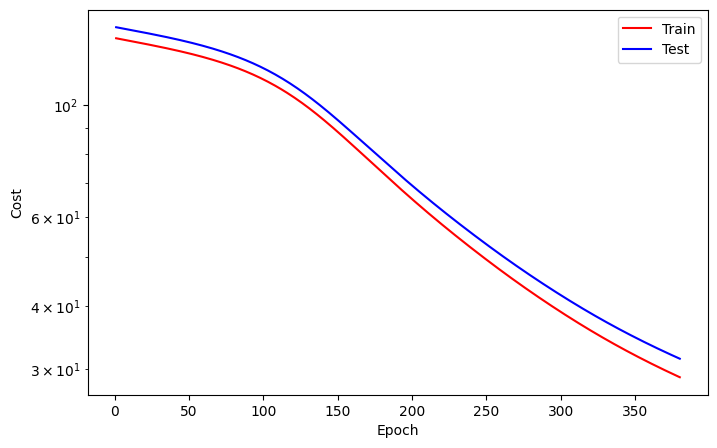

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   381
Train_cost  = 28.7994 | Test_cost  = 31.3369 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   382
Train_cost  = 28.7104 | Test_cost  = 31.2427 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   383
Train_cost  = 28.6221 | Test_cost  = 31.1492 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   384
Train_cost  = 28.5345 | Test_cost  = 31.0563 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   385
Train_cost  = 28.4474 | Test_cost  = 30.9641 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   386
Train_cost  = 28.3610 | Test_cost  = 30.8725 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   387
Train_cost  = 28.2752 | Test_cost  = 30.7816 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   388
Train_cost  = 28.1899 | Test_cost  = 30.6912 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   389
Train_cost  = 28.1053 | Test_cost  = 30.6015 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   390
Train_cost  = 28.0212 | Test_cost  = 30.5124 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   391
Train_cost  = 27.9377 | Test_cost  = 30.4239 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   392
Train_cost  = 27.8548 | Test_cost  = 30.3360 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   393
Train_cost  = 27.7725 | Test_cost  = 30.2487 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   394
Train_cost  = 27.6907 | Test_cost  = 30.1620 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   395
Train_cost  = 27.6095 | Test_cost  = 30.0758 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   396
Train_cost  = 27.5288 | Test_cost  = 29.9903 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   397
Train_cost  = 27.4486 | Test_cost  = 29.9052 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   398
Train_cost  = 27.3690 | Test_cost  = 29.8207 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   399
Train_cost  = 27.2899 | Test_cost  = 29.7368 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   400
Train_cost  = 27.2114 | Test_cost  = 29.6534 | 


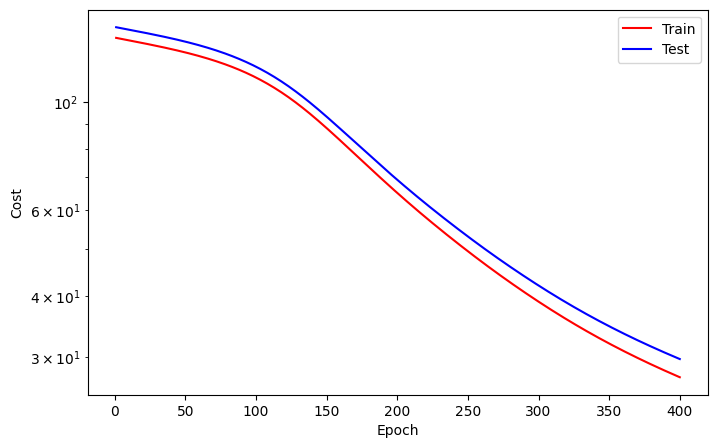

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   401
Train_cost  = 27.1333 | Test_cost  = 29.5706 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   402
Train_cost  = 27.0558 | Test_cost  = 29.4883 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   403
Train_cost  = 26.9787 | Test_cost  = 29.4065 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   404
Train_cost  = 26.9021 | Test_cost  = 29.3252 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   405
Train_cost  = 26.8261 | Test_cost  = 29.2444 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   406
Train_cost  = 26.7505 | Test_cost  = 29.1641 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   407
Train_cost  = 26.6754 | Test_cost  = 29.0843 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   408
Train_cost  = 26.6007 | Test_cost  = 29.0050 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   409
Train_cost  = 26.5266 | Test_cost  = 28.9262 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   410
Train_cost  = 26.4529 | Test_cost  = 28.8479 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   411
Train_cost  = 26.3796 | Test_cost  = 28.7700 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   412
Train_cost  = 26.3068 | Test_cost  = 28.6926 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   413
Train_cost  = 26.2344 | Test_cost  = 28.6157 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   414
Train_cost  = 26.1625 | Test_cost  = 28.5392 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   415
Train_cost  = 26.0910 | Test_cost  = 28.4632 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   416
Train_cost  = 26.0199 | Test_cost  = 28.3875 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   417
Train_cost  = 25.9492 | Test_cost  = 28.3124 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   418
Train_cost  = 25.8790 | Test_cost  = 28.2376 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   419
Train_cost  = 25.8091 | Test_cost  = 28.1633 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   420
Train_cost  = 25.7397 | Test_cost  = 28.0894 | 


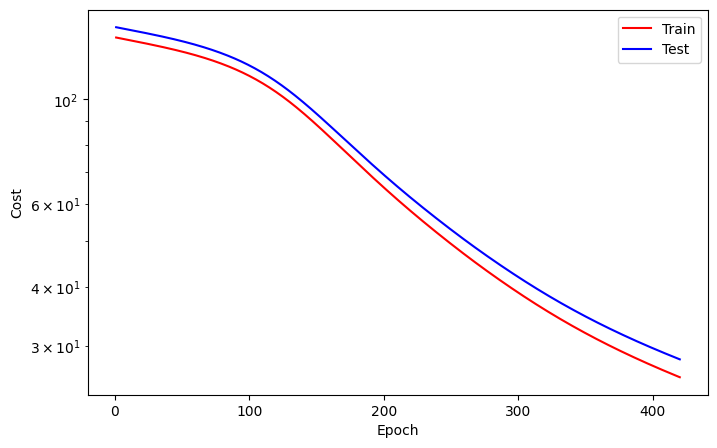

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   421
Train_cost  = 25.6706 | Test_cost  = 28.0159 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   422
Train_cost  = 25.6019 | Test_cost  = 27.9428 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   423
Train_cost  = 25.5337 | Test_cost  = 27.8701 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   424
Train_cost  = 25.4658 | Test_cost  = 27.7978 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   425
Train_cost  = 25.3983 | Test_cost  = 27.7259 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   426
Train_cost  = 25.3311 | Test_cost  = 27.6544 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   427
Train_cost  = 25.2643 | Test_cost  = 27.5832 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   428
Train_cost  = 25.1979 | Test_cost  = 27.5124 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   429
Train_cost  = 25.1318 | Test_cost  = 27.4420 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   430
Train_cost  = 25.0660 | Test_cost  = 27.3719 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   431
Train_cost  = 25.0006 | Test_cost  = 27.3022 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   432
Train_cost  = 24.9356 | Test_cost  = 27.2328 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   433
Train_cost  = 24.8708 | Test_cost  = 27.1637 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   434
Train_cost  = 24.8064 | Test_cost  = 27.0950 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   435
Train_cost  = 24.7423 | Test_cost  = 27.0266 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   436
Train_cost  = 24.6786 | Test_cost  = 26.9586 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   437
Train_cost  = 24.6151 | Test_cost  = 26.8908 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   438
Train_cost  = 24.5519 | Test_cost  = 26.8234 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   439
Train_cost  = 24.4891 | Test_cost  = 26.7563 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   440
Train_cost  = 24.4265 | Test_cost  = 26.6894 | 


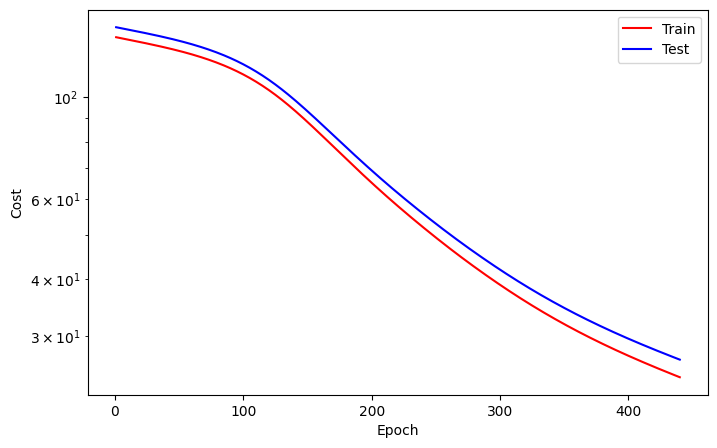

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   441
Train_cost  = 24.3642 | Test_cost  = 26.6229 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   442
Train_cost  = 24.3022 | Test_cost  = 26.5566 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   443
Train_cost  = 24.2404 | Test_cost  = 26.4906 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   444
Train_cost  = 24.1790 | Test_cost  = 26.4249 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   445
Train_cost  = 24.1178 | Test_cost  = 26.3595 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   446
Train_cost  = 24.0568 | Test_cost  = 26.2944 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   447
Train_cost  = 23.9962 | Test_cost  = 26.2295 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   448
Train_cost  = 23.9358 | Test_cost  = 26.1648 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   449
Train_cost  = 23.8756 | Test_cost  = 26.1005 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   450
Train_cost  = 23.8157 | Test_cost  = 26.0363 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   451
Train_cost  = 23.7560 | Test_cost  = 25.9724 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   452
Train_cost  = 23.6966 | Test_cost  = 25.9088 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   453
Train_cost  = 23.6374 | Test_cost  = 25.8454 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   454
Train_cost  = 23.5784 | Test_cost  = 25.7822 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   455
Train_cost  = 23.5197 | Test_cost  = 25.7193 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   456
Train_cost  = 23.4611 | Test_cost  = 25.6566 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   457
Train_cost  = 23.4029 | Test_cost  = 25.5941 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   458
Train_cost  = 23.3448 | Test_cost  = 25.5319 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   459
Train_cost  = 23.2870 | Test_cost  = 25.4699 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   460
Train_cost  = 23.2294 | Test_cost  = 25.4081 | 


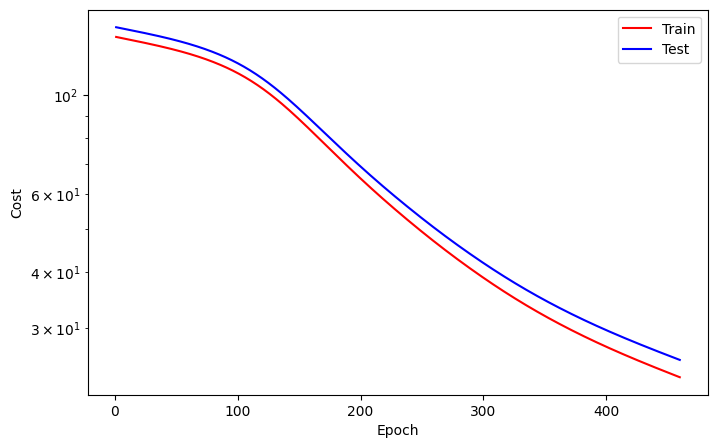

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   461
Train_cost  = 23.1720 | Test_cost  = 25.3465 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   462
Train_cost  = 23.1148 | Test_cost  = 25.2852 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   463
Train_cost  = 23.0579 | Test_cost  = 25.2241 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   464
Train_cost  = 23.0012 | Test_cost  = 25.1632 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   465
Train_cost  = 22.9447 | Test_cost  = 25.1026 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   466
Train_cost  = 22.8884 | Test_cost  = 25.0422 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   467
Train_cost  = 22.8324 | Test_cost  = 24.9820 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   468
Train_cost  = 22.7766 | Test_cost  = 24.9220 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   469
Train_cost  = 22.7210 | Test_cost  = 24.8623 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   470
Train_cost  = 22.6656 | Test_cost  = 24.8028 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   471
Train_cost  = 22.6105 | Test_cost  = 24.7436 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   472
Train_cost  = 22.5556 | Test_cost  = 24.6846 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   473
Train_cost  = 22.5010 | Test_cost  = 24.6259 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   474
Train_cost  = 22.4466 | Test_cost  = 24.5674 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   475
Train_cost  = 22.3925 | Test_cost  = 24.5092 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   476
Train_cost  = 22.3386 | Test_cost  = 24.4513 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   477
Train_cost  = 22.2850 | Test_cost  = 24.3936 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   478
Train_cost  = 22.2316 | Test_cost  = 24.3361 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   479
Train_cost  = 22.1785 | Test_cost  = 24.2790 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   480
Train_cost  = 22.1256 | Test_cost  = 24.2221 | 


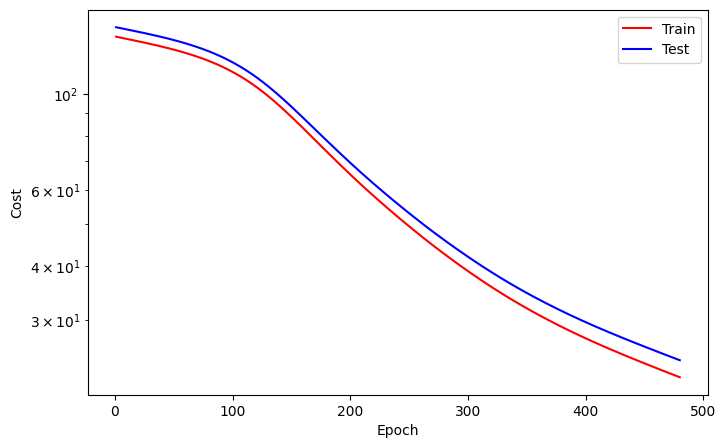

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   481
Train_cost  = 22.0730 | Test_cost  = 24.1655 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   482
Train_cost  = 22.0207 | Test_cost  = 24.1091 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   483
Train_cost  = 21.9687 | Test_cost  = 24.0531 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   484
Train_cost  = 21.9169 | Test_cost  = 23.9973 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   485
Train_cost  = 21.8654 | Test_cost  = 23.9418 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   486
Train_cost  = 21.8141 | Test_cost  = 23.8866 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   487
Train_cost  = 21.7632 | Test_cost  = 23.8316 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   488
Train_cost  = 21.7124 | Test_cost  = 23.7769 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   489
Train_cost  = 21.6620 | Test_cost  = 23.7226 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   490
Train_cost  = 21.6118 | Test_cost  = 23.6684 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   491
Train_cost  = 21.5619 | Test_cost  = 23.6146 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   492
Train_cost  = 21.5123 | Test_cost  = 23.5610 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   493
Train_cost  = 21.4629 | Test_cost  = 23.5077 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   494
Train_cost  = 21.4138 | Test_cost  = 23.4547 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   495
Train_cost  = 21.3649 | Test_cost  = 23.4019 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   496
Train_cost  = 21.3163 | Test_cost  = 23.3494 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   497
Train_cost  = 21.2680 | Test_cost  = 23.2971 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   498
Train_cost  = 21.2199 | Test_cost  = 23.2451 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   499
Train_cost  = 21.1720 | Test_cost  = 23.1934 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   500
Train_cost  = 21.1243 | Test_cost  = 23.1418 | 


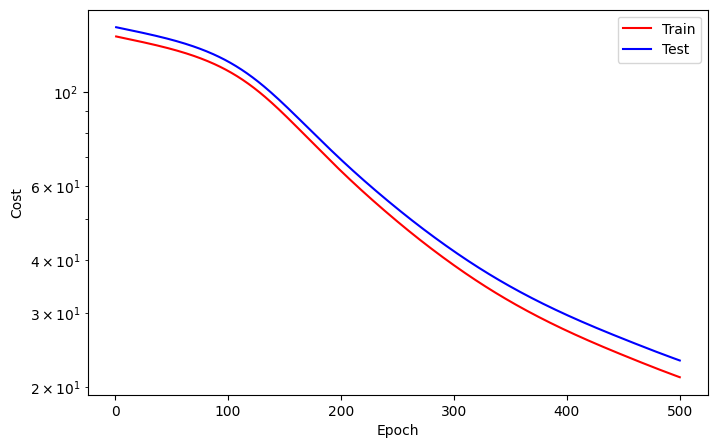

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   501
Train_cost  = 21.0769 | Test_cost  = 23.0906 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   502
Train_cost  = 21.0298 | Test_cost  = 23.0395 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   503
Train_cost  = 20.9828 | Test_cost  = 22.9887 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   504
Train_cost  = 20.9361 | Test_cost  = 22.9381 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   505
Train_cost  = 20.8896 | Test_cost  = 22.8878 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   506
Train_cost  = 20.8433 | Test_cost  = 22.8377 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   507
Train_cost  = 20.7973 | Test_cost  = 22.7878 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   508
Train_cost  = 20.7515 | Test_cost  = 22.7381 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   509
Train_cost  = 20.7058 | Test_cost  = 22.6887 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   510
Train_cost  = 20.6604 | Test_cost  = 22.6395 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   511
Train_cost  = 20.6152 | Test_cost  = 22.5905 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   512
Train_cost  = 20.5703 | Test_cost  = 22.5417 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   513
Train_cost  = 20.5255 | Test_cost  = 22.4932 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   514
Train_cost  = 20.4810 | Test_cost  = 22.4449 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   515
Train_cost  = 20.4367 | Test_cost  = 22.3968 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   516
Train_cost  = 20.3926 | Test_cost  = 22.3490 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   517
Train_cost  = 20.3487 | Test_cost  = 22.3014 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   518
Train_cost  = 20.3050 | Test_cost  = 22.2540 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   519
Train_cost  = 20.2616 | Test_cost  = 22.2069 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   520
Train_cost  = 20.2184 | Test_cost  = 22.1600 | 


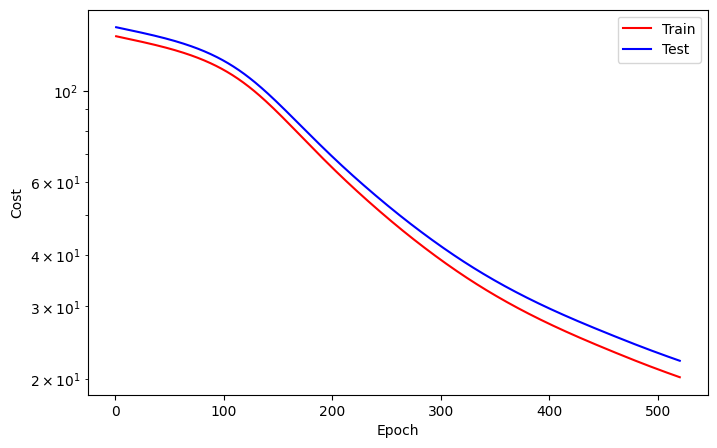

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   521
Train_cost  = 20.1754 | Test_cost  = 22.1134 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   522
Train_cost  = 20.1327 | Test_cost  = 22.0671 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   523
Train_cost  = 20.0902 | Test_cost  = 22.0210 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   524
Train_cost  = 20.0480 | Test_cost  = 21.9752 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   525
Train_cost  = 20.0060 | Test_cost  = 21.9296 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   526
Train_cost  = 19.9643 | Test_cost  = 21.8843 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   527
Train_cost  = 19.9228 | Test_cost  = 21.8393 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   528
Train_cost  = 19.8816 | Test_cost  = 21.7946 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   529
Train_cost  = 19.8406 | Test_cost  = 21.7502 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   530
Train_cost  = 19.8000 | Test_cost  = 21.7061 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   531
Train_cost  = 19.7596 | Test_cost  = 21.6622 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   532
Train_cost  = 19.7194 | Test_cost  = 21.6187 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   533
Train_cost  = 19.6796 | Test_cost  = 21.5754 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   534
Train_cost  = 19.6400 | Test_cost  = 21.5325 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   535
Train_cost  = 19.6007 | Test_cost  = 21.4899 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   536
Train_cost  = 19.5616 | Test_cost  = 21.4475 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   537
Train_cost  = 19.5229 | Test_cost  = 21.4055 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   538
Train_cost  = 19.4844 | Test_cost  = 21.3637 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   539
Train_cost  = 19.4462 | Test_cost  = 21.3223 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   540
Train_cost  = 19.4083 | Test_cost  = 21.2811 | 


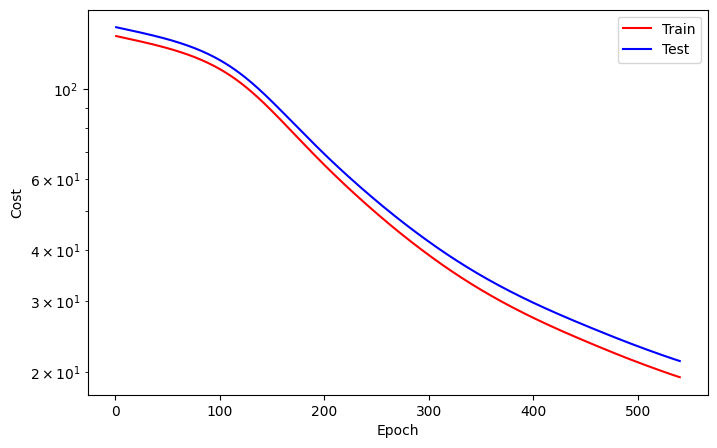

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   541
Train_cost  = 19.3707 | Test_cost  = 21.2403 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   542
Train_cost  = 19.3333 | Test_cost  = 21.1997 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   543
Train_cost  = 19.2962 | Test_cost  = 21.1595 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   544
Train_cost  = 19.2594 | Test_cost  = 21.1195 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   545
Train_cost  = 19.2228 | Test_cost  = 21.0798 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   546
Train_cost  = 19.1865 | Test_cost  = 21.0404 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   547
Train_cost  = 19.1505 | Test_cost  = 21.0013 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   548
Train_cost  = 19.1147 | Test_cost  = 20.9625 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   549
Train_cost  = 19.0792 | Test_cost  = 20.9239 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   550
Train_cost  = 19.0440 | Test_cost  = 20.8856 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   551
Train_cost  = 19.0089 | Test_cost  = 20.8475 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   552
Train_cost  = 18.9742 | Test_cost  = 20.8097 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   553
Train_cost  = 18.9396 | Test_cost  = 20.7722 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   554
Train_cost  = 18.9053 | Test_cost  = 20.7349 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   555
Train_cost  = 18.8713 | Test_cost  = 20.6978 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   556
Train_cost  = 18.8374 | Test_cost  = 20.6610 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   557
Train_cost  = 18.8038 | Test_cost  = 20.6244 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   558
Train_cost  = 18.7704 | Test_cost  = 20.5881 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   559
Train_cost  = 18.7372 | Test_cost  = 20.5520 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   560
Train_cost  = 18.7043 | Test_cost  = 20.5161 | 


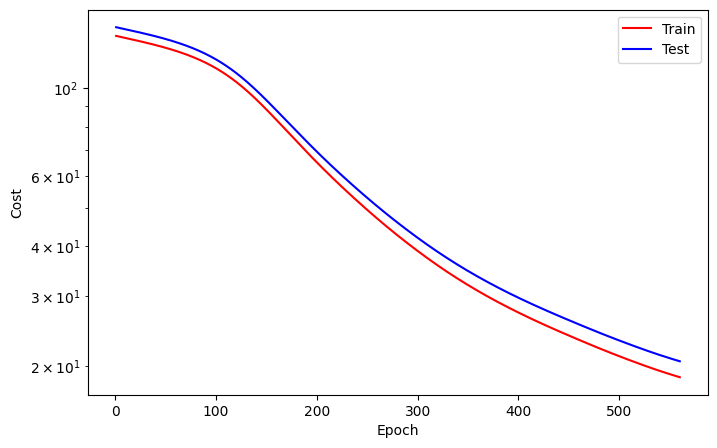

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   561
Train_cost  = 18.6715 | Test_cost  = 20.4805 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   562
Train_cost  = 18.6390 | Test_cost  = 20.4450 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   563
Train_cost  = 18.6066 | Test_cost  = 20.4098 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   564
Train_cost  = 18.5745 | Test_cost  = 20.3748 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   565
Train_cost  = 18.5425 | Test_cost  = 20.3399 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   566
Train_cost  = 18.5108 | Test_cost  = 20.3053 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   567
Train_cost  = 18.4792 | Test_cost  = 20.2709 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   568
Train_cost  = 18.4478 | Test_cost  = 20.2367 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   569
Train_cost  = 18.4166 | Test_cost  = 20.2027 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   570
Train_cost  = 18.3856 | Test_cost  = 20.1689 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   571
Train_cost  = 18.3548 | Test_cost  = 20.1352 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   572
Train_cost  = 18.3242 | Test_cost  = 20.1018 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   573
Train_cost  = 18.2937 | Test_cost  = 20.0685 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   574
Train_cost  = 18.2634 | Test_cost  = 20.0354 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   575
Train_cost  = 18.2332 | Test_cost  = 20.0025 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   576
Train_cost  = 18.2033 | Test_cost  = 19.9698 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   577
Train_cost  = 18.1735 | Test_cost  = 19.9373 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   578
Train_cost  = 18.1438 | Test_cost  = 19.9049 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   579
Train_cost  = 18.1143 | Test_cost  = 19.8727 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   580
Train_cost  = 18.0850 | Test_cost  = 19.8406 | 


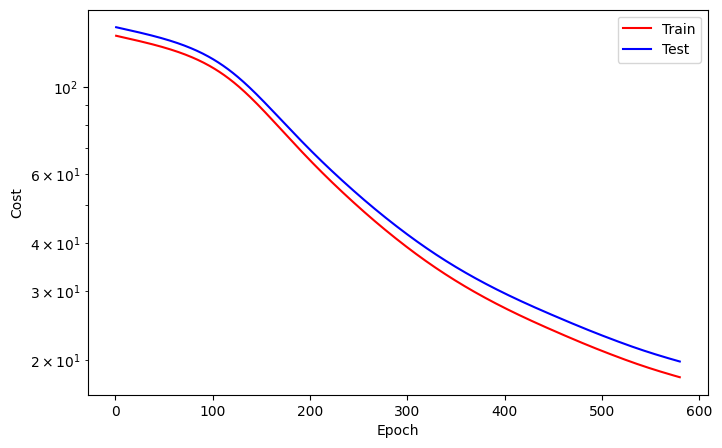

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   581
Train_cost  = 18.0559 | Test_cost  = 19.8087 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   582
Train_cost  = 18.0268 | Test_cost  = 19.7770 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   583
Train_cost  = 17.9980 | Test_cost  = 19.7455 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   584
Train_cost  = 17.9693 | Test_cost  = 19.7141 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   585
Train_cost  = 17.9407 | Test_cost  = 19.6828 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   586
Train_cost  = 17.9123 | Test_cost  = 19.6517 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   587
Train_cost  = 17.8841 | Test_cost  = 19.6208 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   588
Train_cost  = 17.8559 | Test_cost  = 19.5900 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   589
Train_cost  = 17.8280 | Test_cost  = 19.5594 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   590
Train_cost  = 17.8001 | Test_cost  = 19.5289 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   591
Train_cost  = 17.7724 | Test_cost  = 19.4986 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   592
Train_cost  = 17.7449 | Test_cost  = 19.4684 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   593
Train_cost  = 17.7175 | Test_cost  = 19.4383 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   594
Train_cost  = 17.6902 | Test_cost  = 19.4084 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   595
Train_cost  = 17.6630 | Test_cost  = 19.3786 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   596
Train_cost  = 17.6360 | Test_cost  = 19.3490 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   597
Train_cost  = 17.6091 | Test_cost  = 19.3195 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   598
Train_cost  = 17.5823 | Test_cost  = 19.2901 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   599
Train_cost  = 17.5557 | Test_cost  = 19.2609 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   600
Train_cost  = 17.5292 | Test_cost  = 19.2318 | 


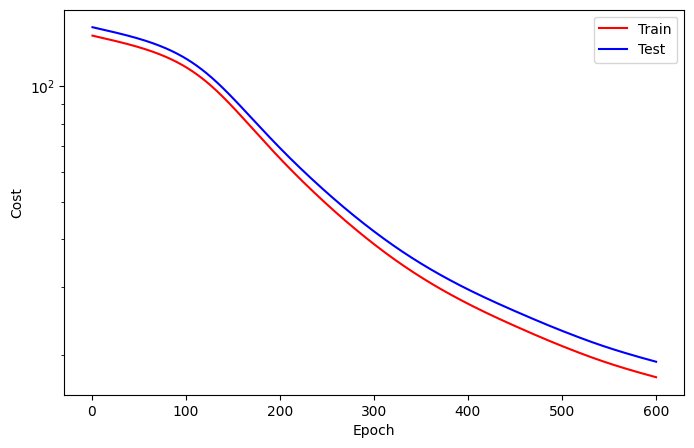

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   601
Train_cost  = 17.5028 | Test_cost  = 19.2028 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   602
Train_cost  = 17.4765 | Test_cost  = 19.1739 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   603
Train_cost  = 17.4504 | Test_cost  = 19.1452 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   604
Train_cost  = 17.4243 | Test_cost  = 19.1166 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   605
Train_cost  = 17.3984 | Test_cost  = 19.0881 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   606
Train_cost  = 17.3726 | Test_cost  = 19.0598 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   607
Train_cost  = 17.3469 | Test_cost  = 19.0315 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   608
Train_cost  = 17.3214 | Test_cost  = 19.0034 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   609
Train_cost  = 17.2959 | Test_cost  = 18.9754 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   610
Train_cost  = 17.2706 | Test_cost  = 18.9475 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   611
Train_cost  = 17.2453 | Test_cost  = 18.9197 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   612
Train_cost  = 17.2202 | Test_cost  = 18.8920 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   613
Train_cost  = 17.1952 | Test_cost  = 18.8645 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   614
Train_cost  = 17.1703 | Test_cost  = 18.8370 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   615
Train_cost  = 17.1455 | Test_cost  = 18.8097 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   616
Train_cost  = 17.1207 | Test_cost  = 18.7825 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   617
Train_cost  = 17.0961 | Test_cost  = 18.7553 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   618
Train_cost  = 17.0716 | Test_cost  = 18.7283 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   619
Train_cost  = 17.0472 | Test_cost  = 18.7014 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   620
Train_cost  = 17.0229 | Test_cost  = 18.6745 | 


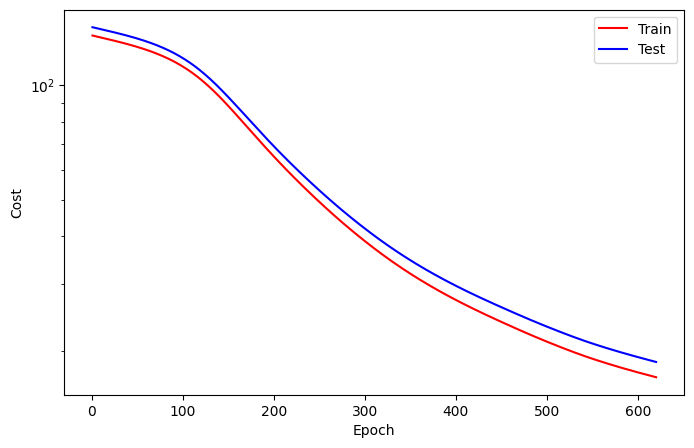

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   621
Train_cost  = 16.9987 | Test_cost  = 18.6478 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   622
Train_cost  = 16.9746 | Test_cost  = 18.6212 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   623
Train_cost  = 16.9505 | Test_cost  = 18.5946 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   624
Train_cost  = 16.9266 | Test_cost  = 18.5682 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   625
Train_cost  = 16.9028 | Test_cost  = 18.5418 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   626
Train_cost  = 16.8790 | Test_cost  = 18.5156 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   627
Train_cost  = 16.8554 | Test_cost  = 18.4894 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   628
Train_cost  = 16.8318 | Test_cost  = 18.4633 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   629
Train_cost  = 16.8083 | Test_cost  = 18.4374 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   630
Train_cost  = 16.7849 | Test_cost  = 18.4115 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   631
Train_cost  = 16.7616 | Test_cost  = 18.3857 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   632
Train_cost  = 16.7384 | Test_cost  = 18.3599 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   633
Train_cost  = 16.7153 | Test_cost  = 18.3343 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   634
Train_cost  = 16.6922 | Test_cost  = 18.3088 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   635
Train_cost  = 16.6693 | Test_cost  = 18.2833 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   636
Train_cost  = 16.6464 | Test_cost  = 18.2580 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   637
Train_cost  = 16.6236 | Test_cost  = 18.2327 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   638
Train_cost  = 16.6009 | Test_cost  = 18.2075 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   639
Train_cost  = 16.5783 | Test_cost  = 18.1824 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   640
Train_cost  = 16.5557 | Test_cost  = 18.1574 | 


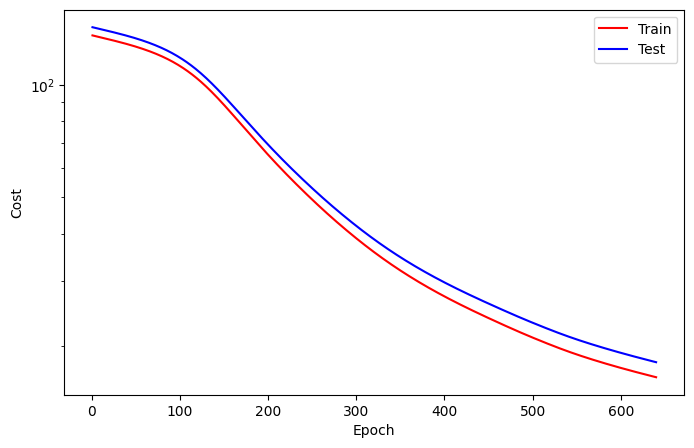

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   641
Train_cost  = 16.5333 | Test_cost  = 18.1325 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   642
Train_cost  = 16.5109 | Test_cost  = 18.1076 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   643
Train_cost  = 16.4887 | Test_cost  = 18.0829 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   644
Train_cost  = 16.4665 | Test_cost  = 18.0583 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   645
Train_cost  = 16.4444 | Test_cost  = 18.0337 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   646
Train_cost  = 16.4224 | Test_cost  = 18.0092 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   647
Train_cost  = 16.4005 | Test_cost  = 17.9849 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   648
Train_cost  = 16.3787 | Test_cost  = 17.9606 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   649
Train_cost  = 16.3569 | Test_cost  = 17.9364 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   650
Train_cost  = 16.3353 | Test_cost  = 17.9124 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   651
Train_cost  = 16.3138 | Test_cost  = 17.8884 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   652
Train_cost  = 16.2923 | Test_cost  = 17.8645 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   653
Train_cost  = 16.2710 | Test_cost  = 17.8408 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   654
Train_cost  = 16.2497 | Test_cost  = 17.8171 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   655
Train_cost  = 16.2286 | Test_cost  = 17.7936 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   656
Train_cost  = 16.2076 | Test_cost  = 17.7701 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   657
Train_cost  = 16.1866 | Test_cost  = 17.7468 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   658
Train_cost  = 16.1658 | Test_cost  = 17.7236 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   659
Train_cost  = 16.1450 | Test_cost  = 17.7005 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   660
Train_cost  = 16.1244 | Test_cost  = 17.6775 | 


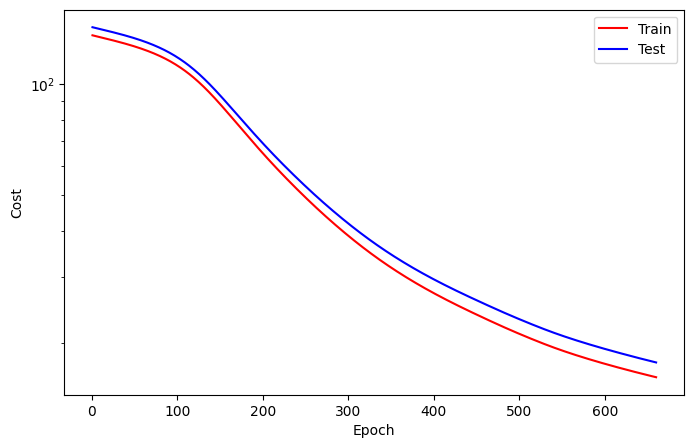

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   661
Train_cost  = 16.1039 | Test_cost  = 17.6546 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   662
Train_cost  = 16.0835 | Test_cost  = 17.6318 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   663
Train_cost  = 16.0632 | Test_cost  = 17.6091 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   664
Train_cost  = 16.0430 | Test_cost  = 17.5866 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   665
Train_cost  = 16.0229 | Test_cost  = 17.5642 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   666
Train_cost  = 16.0029 | Test_cost  = 17.5419 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   667
Train_cost  = 15.9830 | Test_cost  = 17.5197 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   668
Train_cost  = 15.9632 | Test_cost  = 17.4976 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   669
Train_cost  = 15.9436 | Test_cost  = 17.4756 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   670
Train_cost  = 15.9240 | Test_cost  = 17.4538 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   671
Train_cost  = 15.9046 | Test_cost  = 17.4320 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   672
Train_cost  = 15.8852 | Test_cost  = 17.4104 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   673
Train_cost  = 15.8660 | Test_cost  = 17.3889 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   674
Train_cost  = 15.8469 | Test_cost  = 17.3675 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   675
Train_cost  = 15.8278 | Test_cost  = 17.3462 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   676
Train_cost  = 15.8089 | Test_cost  = 17.3251 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   677
Train_cost  = 15.7901 | Test_cost  = 17.3040 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   678
Train_cost  = 15.7714 | Test_cost  = 17.2831 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   679
Train_cost  = 15.7528 | Test_cost  = 17.2623 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   680
Train_cost  = 15.7343 | Test_cost  = 17.2415 | 


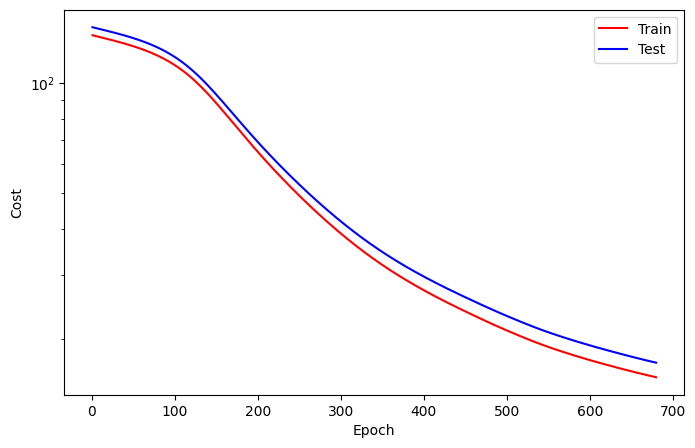

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   681
Train_cost  = 15.7159 | Test_cost  = 17.2209 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   682
Train_cost  = 15.6976 | Test_cost  = 17.2004 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   683
Train_cost  = 15.6794 | Test_cost  = 17.1800 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   684
Train_cost  = 15.6613 | Test_cost  = 17.1597 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   685
Train_cost  = 15.6433 | Test_cost  = 17.1396 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   686
Train_cost  = 15.6254 | Test_cost  = 17.1195 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   687
Train_cost  = 15.6076 | Test_cost  = 17.0995 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   688
Train_cost  = 15.5899 | Test_cost  = 17.0796 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   689
Train_cost  = 15.5723 | Test_cost  = 17.0599 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   690
Train_cost  = 15.5547 | Test_cost  = 17.0402 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   691
Train_cost  = 15.5373 | Test_cost  = 17.0207 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   692
Train_cost  = 15.5200 | Test_cost  = 17.0012 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   693
Train_cost  = 15.5027 | Test_cost  = 16.9818 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   694
Train_cost  = 15.4856 | Test_cost  = 16.9626 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   695
Train_cost  = 15.4685 | Test_cost  = 16.9434 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   696
Train_cost  = 15.4516 | Test_cost  = 16.9243 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   697
Train_cost  = 15.4347 | Test_cost  = 16.9054 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   698
Train_cost  = 15.4179 | Test_cost  = 16.8865 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   699
Train_cost  = 15.4012 | Test_cost  = 16.8677 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   700
Train_cost  = 15.3846 | Test_cost  = 16.8490 | 


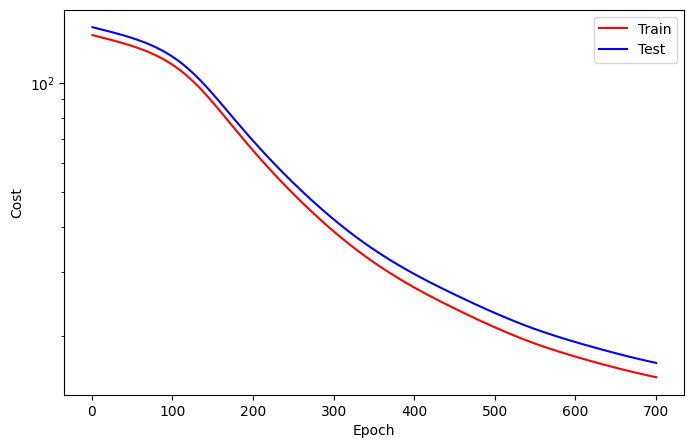

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   701
Train_cost  = 15.3681 | Test_cost  = 16.8304 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   702
Train_cost  = 15.3517 | Test_cost  = 16.8119 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   703
Train_cost  = 15.3353 | Test_cost  = 16.7935 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   704
Train_cost  = 15.3190 | Test_cost  = 16.7752 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   705
Train_cost  = 15.3029 | Test_cost  = 16.7570 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   706
Train_cost  = 15.2868 | Test_cost  = 16.7389 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   707
Train_cost  = 15.2708 | Test_cost  = 16.7208 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   708
Train_cost  = 15.2548 | Test_cost  = 16.7029 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   709
Train_cost  = 15.2390 | Test_cost  = 16.6850 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   710
Train_cost  = 15.2232 | Test_cost  = 16.6672 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   711
Train_cost  = 15.2075 | Test_cost  = 16.6495 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   712
Train_cost  = 15.1919 | Test_cost  = 16.6319 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   713
Train_cost  = 15.1764 | Test_cost  = 16.6144 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   714
Train_cost  = 15.1610 | Test_cost  = 16.5970 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   715
Train_cost  = 15.1456 | Test_cost  = 16.5796 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   716
Train_cost  = 15.1303 | Test_cost  = 16.5623 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   717
Train_cost  = 15.1151 | Test_cost  = 16.5452 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   718
Train_cost  = 15.1000 | Test_cost  = 16.5281 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   719
Train_cost  = 15.0849 | Test_cost  = 16.5110 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   720
Train_cost  = 15.0699 | Test_cost  = 16.4941 | 


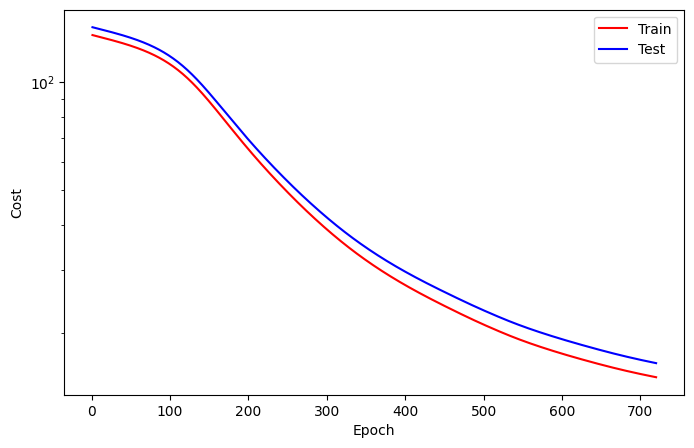

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   721
Train_cost  = 15.0550 | Test_cost  = 16.4773 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   722
Train_cost  = 15.0402 | Test_cost  = 16.4605 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   723
Train_cost  = 15.0255 | Test_cost  = 16.4438 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   724
Train_cost  = 15.0108 | Test_cost  = 16.4272 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   725
Train_cost  = 14.9962 | Test_cost  = 16.4107 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   726
Train_cost  = 14.9817 | Test_cost  = 16.3942 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   727
Train_cost  = 14.9672 | Test_cost  = 16.3778 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   728
Train_cost  = 14.9528 | Test_cost  = 16.3615 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   729
Train_cost  = 14.9385 | Test_cost  = 16.3453 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   730
Train_cost  = 14.9243 | Test_cost  = 16.3292 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   731
Train_cost  = 14.9101 | Test_cost  = 16.3131 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   732
Train_cost  = 14.8960 | Test_cost  = 16.2971 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   733
Train_cost  = 14.8820 | Test_cost  = 16.2812 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   734
Train_cost  = 14.8680 | Test_cost  = 16.2653 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   735
Train_cost  = 14.8541 | Test_cost  = 16.2496 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   736
Train_cost  = 14.8403 | Test_cost  = 16.2339 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   737
Train_cost  = 14.8265 | Test_cost  = 16.2183 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   738
Train_cost  = 14.8128 | Test_cost  = 16.2027 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   739
Train_cost  = 14.7992 | Test_cost  = 16.1872 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   740
Train_cost  = 14.7857 | Test_cost  = 16.1718 | 


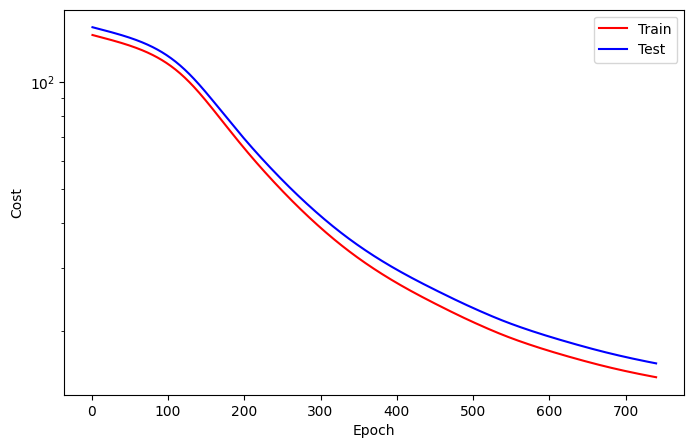

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   741
Train_cost  = 14.7722 | Test_cost  = 16.1565 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   742
Train_cost  = 14.7588 | Test_cost  = 16.1412 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   743
Train_cost  = 14.7454 | Test_cost  = 16.1260 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   744
Train_cost  = 14.7321 | Test_cost  = 16.1109 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   745
Train_cost  = 14.7189 | Test_cost  = 16.0959 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   746
Train_cost  = 14.7057 | Test_cost  = 16.0809 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   747
Train_cost  = 14.6927 | Test_cost  = 16.0660 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   748
Train_cost  = 14.6796 | Test_cost  = 16.0511 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   749
Train_cost  = 14.6667 | Test_cost  = 16.0364 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   750
Train_cost  = 14.6538 | Test_cost  = 16.0217 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   751
Train_cost  = 14.6409 | Test_cost  = 16.0070 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   752
Train_cost  = 14.6281 | Test_cost  = 15.9925 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   753
Train_cost  = 14.6154 | Test_cost  = 15.9780 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   754
Train_cost  = 14.6028 | Test_cost  = 15.9635 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   755
Train_cost  = 14.5902 | Test_cost  = 15.9491 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   756
Train_cost  = 14.5777 | Test_cost  = 15.9348 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   757
Train_cost  = 14.5652 | Test_cost  = 15.9206 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   758
Train_cost  = 14.5528 | Test_cost  = 15.9064 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   759
Train_cost  = 14.5404 | Test_cost  = 15.8923 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   760
Train_cost  = 14.5281 | Test_cost  = 15.8783 | 


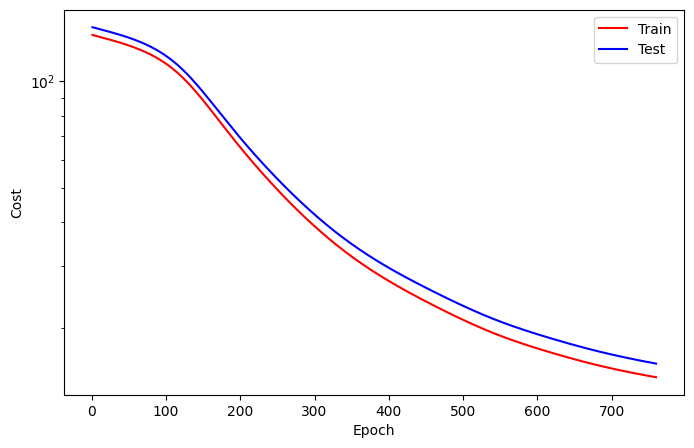

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   761
Train_cost  = 14.5159 | Test_cost  = 15.8643 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   762
Train_cost  = 14.5037 | Test_cost  = 15.8504 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   763
Train_cost  = 14.4916 | Test_cost  = 15.8365 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   764
Train_cost  = 14.4796 | Test_cost  = 15.8227 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   765
Train_cost  = 14.4676 | Test_cost  = 15.8090 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   766
Train_cost  = 14.4557 | Test_cost  = 15.7953 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   767
Train_cost  = 14.4438 | Test_cost  = 15.7817 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   768
Train_cost  = 14.4319 | Test_cost  = 15.7682 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   769
Train_cost  = 14.4202 | Test_cost  = 15.7547 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   770
Train_cost  = 14.4085 | Test_cost  = 15.7413 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   771
Train_cost  = 14.3968 | Test_cost  = 15.7279 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   772
Train_cost  = 14.3852 | Test_cost  = 15.7146 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   773
Train_cost  = 14.3737 | Test_cost  = 15.7013 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   774
Train_cost  = 14.3622 | Test_cost  = 15.6882 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   775
Train_cost  = 14.3508 | Test_cost  = 15.6750 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   776
Train_cost  = 14.3394 | Test_cost  = 15.6620 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   777
Train_cost  = 14.3281 | Test_cost  = 15.6490 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   778
Train_cost  = 14.3168 | Test_cost  = 15.6360 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   779
Train_cost  = 14.3056 | Test_cost  = 15.6231 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   780
Train_cost  = 14.2944 | Test_cost  = 15.6103 | 


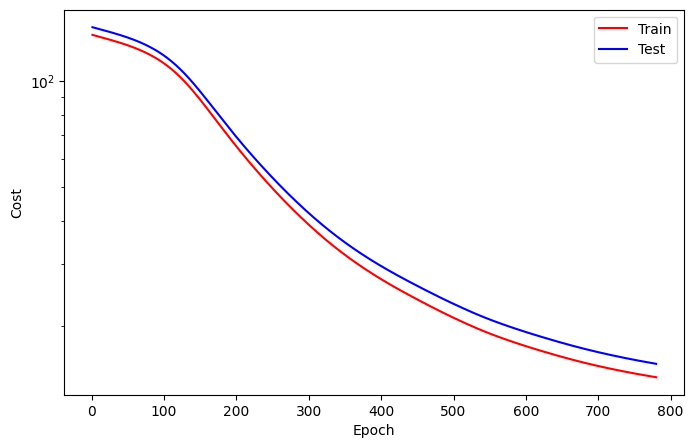

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   781
Train_cost  = 14.2833 | Test_cost  = 15.5975 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   782
Train_cost  = 14.2723 | Test_cost  = 15.5848 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   783
Train_cost  = 14.2613 | Test_cost  = 15.5721 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   784
Train_cost  = 14.2503 | Test_cost  = 15.5595 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   785
Train_cost  = 14.2394 | Test_cost  = 15.5470 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   786
Train_cost  = 14.2286 | Test_cost  = 15.5345 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   787
Train_cost  = 14.2178 | Test_cost  = 15.5220 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   788
Train_cost  = 14.2070 | Test_cost  = 15.5097 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   789
Train_cost  = 14.1964 | Test_cost  = 15.4973 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   790
Train_cost  = 14.1857 | Test_cost  = 15.4851 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   791
Train_cost  = 14.1751 | Test_cost  = 15.4728 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   792
Train_cost  = 14.1646 | Test_cost  = 15.4607 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   793
Train_cost  = 14.1541 | Test_cost  = 15.4486 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   794
Train_cost  = 14.1437 | Test_cost  = 15.4365 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   795
Train_cost  = 14.1333 | Test_cost  = 15.4245 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   796
Train_cost  = 14.1229 | Test_cost  = 15.4126 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   797
Train_cost  = 14.1126 | Test_cost  = 15.4007 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   798
Train_cost  = 14.1024 | Test_cost  = 15.3888 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   799
Train_cost  = 14.0922 | Test_cost  = 15.3770 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   800
Train_cost  = 14.0821 | Test_cost  = 15.3653 | 


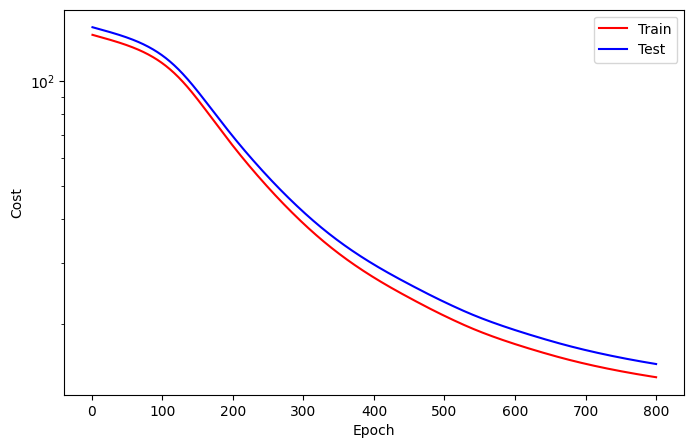

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   801
Train_cost  = 14.0720 | Test_cost  = 15.3536 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   802
Train_cost  = 14.0619 | Test_cost  = 15.3419 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   803
Train_cost  = 14.0519 | Test_cost  = 15.3304 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   804
Train_cost  = 14.0420 | Test_cost  = 15.3188 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   805
Train_cost  = 14.0321 | Test_cost  = 15.3073 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   806
Train_cost  = 14.0222 | Test_cost  = 15.2959 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   807
Train_cost  = 14.0124 | Test_cost  = 15.2845 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   808
Train_cost  = 14.0026 | Test_cost  = 15.2732 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   809
Train_cost  = 13.9929 | Test_cost  = 15.2619 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   810
Train_cost  = 13.9832 | Test_cost  = 15.2507 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   811
Train_cost  = 13.9736 | Test_cost  = 15.2395 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   812
Train_cost  = 13.9640 | Test_cost  = 15.2283 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   813
Train_cost  = 13.9544 | Test_cost  = 15.2172 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   814
Train_cost  = 13.9450 | Test_cost  = 15.2062 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   815
Train_cost  = 13.9355 | Test_cost  = 15.1952 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   816
Train_cost  = 13.9261 | Test_cost  = 15.1843 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   817
Train_cost  = 13.9167 | Test_cost  = 15.1734 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   818
Train_cost  = 13.9074 | Test_cost  = 15.1625 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   819
Train_cost  = 13.8981 | Test_cost  = 15.1517 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   820
Train_cost  = 13.8889 | Test_cost  = 15.1410 | 


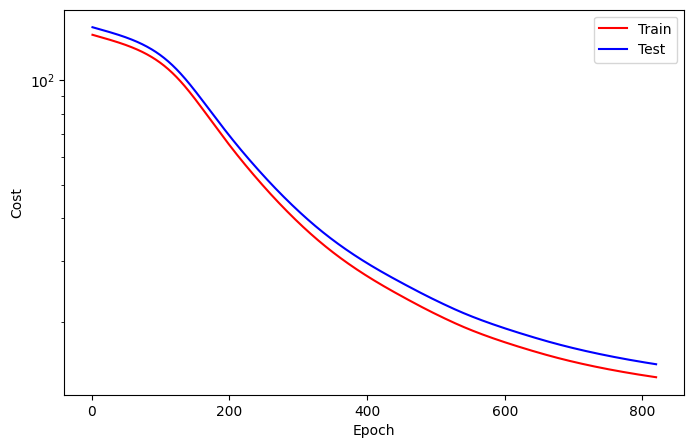

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   821
Train_cost  = 13.8797 | Test_cost  = 15.1302 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   822
Train_cost  = 13.8706 | Test_cost  = 15.1196 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   823
Train_cost  = 13.8615 | Test_cost  = 15.1090 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   824
Train_cost  = 13.8524 | Test_cost  = 15.0984 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   825
Train_cost  = 13.8434 | Test_cost  = 15.0879 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   826
Train_cost  = 13.8344 | Test_cost  = 15.0774 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   827
Train_cost  = 13.8255 | Test_cost  = 15.0670 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   828
Train_cost  = 13.8166 | Test_cost  = 15.0566 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   829
Train_cost  = 13.8077 | Test_cost  = 15.0462 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   830
Train_cost  = 13.7989 | Test_cost  = 15.0359 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   831
Train_cost  = 13.7902 | Test_cost  = 15.0257 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   832
Train_cost  = 13.7814 | Test_cost  = 15.0154 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   833
Train_cost  = 13.7727 | Test_cost  = 15.0053 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   834
Train_cost  = 13.7641 | Test_cost  = 14.9952 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   835
Train_cost  = 13.7555 | Test_cost  = 14.9851 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   836
Train_cost  = 13.7469 | Test_cost  = 14.9750 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   837
Train_cost  = 13.7384 | Test_cost  = 14.9650 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   838
Train_cost  = 13.7299 | Test_cost  = 14.9551 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   839
Train_cost  = 13.7215 | Test_cost  = 14.9452 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   840
Train_cost  = 13.7131 | Test_cost  = 14.9353 | 


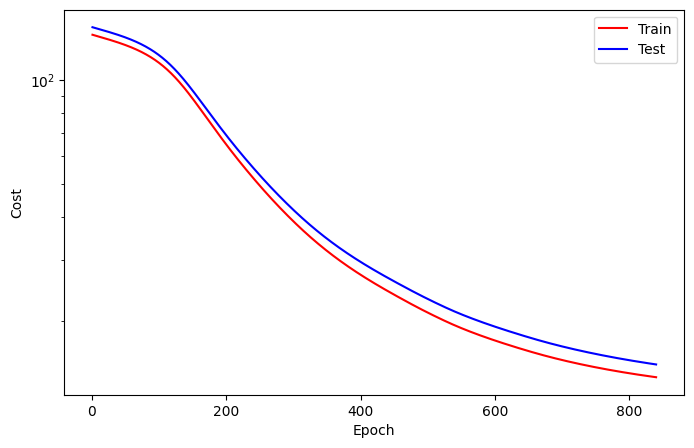

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   841
Train_cost  = 13.7047 | Test_cost  = 14.9255 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   842
Train_cost  = 13.6964 | Test_cost  = 14.9157 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   843
Train_cost  = 13.6881 | Test_cost  = 14.9059 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   844
Train_cost  = 13.6798 | Test_cost  = 14.8962 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   845
Train_cost  = 13.6716 | Test_cost  = 14.8866 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   846
Train_cost  = 13.6634 | Test_cost  = 14.8770 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   847
Train_cost  = 13.6553 | Test_cost  = 14.8674 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   848
Train_cost  = 13.6472 | Test_cost  = 14.8578 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   849
Train_cost  = 13.6391 | Test_cost  = 14.8483 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   850
Train_cost  = 13.6311 | Test_cost  = 14.8389 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   851
Train_cost  = 13.6231 | Test_cost  = 14.8294 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   852
Train_cost  = 13.6151 | Test_cost  = 14.8201 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   853
Train_cost  = 13.6072 | Test_cost  = 14.8107 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   854
Train_cost  = 13.5993 | Test_cost  = 14.8014 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   855
Train_cost  = 13.5915 | Test_cost  = 14.7922 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   856
Train_cost  = 13.5837 | Test_cost  = 14.7829 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   857
Train_cost  = 13.5759 | Test_cost  = 14.7737 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   858
Train_cost  = 13.5681 | Test_cost  = 14.7646 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   859
Train_cost  = 13.5604 | Test_cost  = 14.7555 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   860
Train_cost  = 13.5528 | Test_cost  = 14.7464 | 


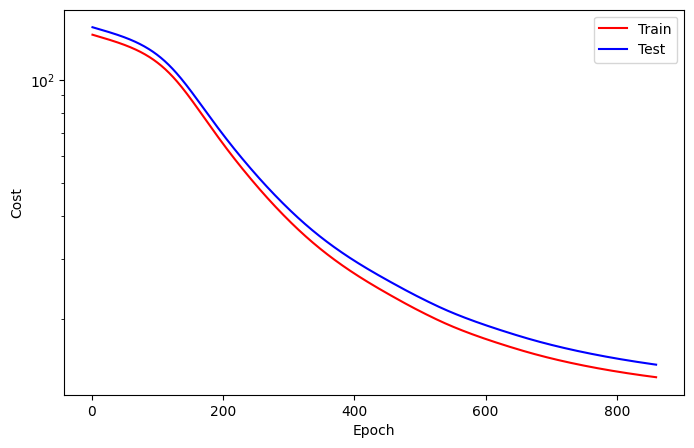

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   861
Train_cost  = 13.5451 | Test_cost  = 14.7374 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   862
Train_cost  = 13.5375 | Test_cost  = 14.7284 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   863
Train_cost  = 13.5300 | Test_cost  = 14.7194 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   864
Train_cost  = 13.5224 | Test_cost  = 14.7105 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   865
Train_cost  = 13.5149 | Test_cost  = 14.7016 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   866
Train_cost  = 13.5075 | Test_cost  = 14.6927 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   867
Train_cost  = 13.5000 | Test_cost  = 14.6839 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   868
Train_cost  = 13.4926 | Test_cost  = 14.6751 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   869
Train_cost  = 13.4853 | Test_cost  = 14.6664 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   870
Train_cost  = 13.4779 | Test_cost  = 14.6576 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   871
Train_cost  = 13.4706 | Test_cost  = 14.6490 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   872
Train_cost  = 13.4634 | Test_cost  = 14.6403 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   873
Train_cost  = 13.4561 | Test_cost  = 14.6317 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   874
Train_cost  = 13.4489 | Test_cost  = 14.6231 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   875
Train_cost  = 13.4418 | Test_cost  = 14.6146 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   876
Train_cost  = 13.4346 | Test_cost  = 14.6061 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   877
Train_cost  = 13.4275 | Test_cost  = 14.5976 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   878
Train_cost  = 13.4204 | Test_cost  = 14.5892 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   879
Train_cost  = 13.4134 | Test_cost  = 14.5807 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   880
Train_cost  = 13.4064 | Test_cost  = 14.5724 | 


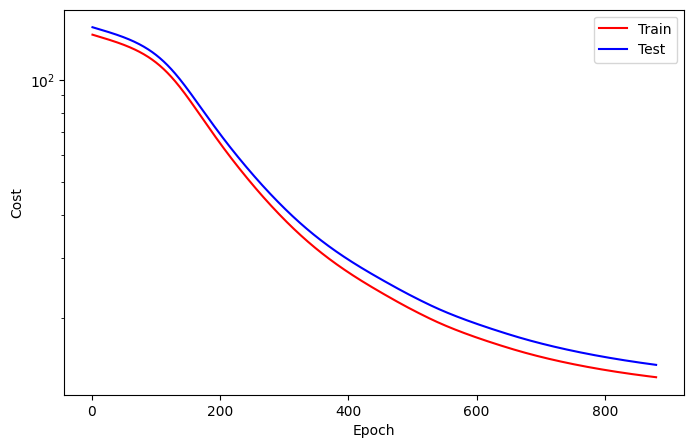

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   881
Train_cost  = 13.3994 | Test_cost  = 14.5640 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   882
Train_cost  = 13.3924 | Test_cost  = 14.5557 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   883
Train_cost  = 13.3855 | Test_cost  = 14.5474 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   884
Train_cost  = 13.3786 | Test_cost  = 14.5392 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   885
Train_cost  = 13.3717 | Test_cost  = 14.5309 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   886
Train_cost  = 13.3649 | Test_cost  = 14.5228 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   887
Train_cost  = 13.3581 | Test_cost  = 14.5146 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   888
Train_cost  = 13.3513 | Test_cost  = 14.5065 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   889
Train_cost  = 13.3446 | Test_cost  = 14.4984 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   890
Train_cost  = 13.3379 | Test_cost  = 14.4903 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   891
Train_cost  = 13.3312 | Test_cost  = 14.4823 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   892
Train_cost  = 13.3245 | Test_cost  = 14.4743 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   893
Train_cost  = 13.3179 | Test_cost  = 14.4663 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   894
Train_cost  = 13.3113 | Test_cost  = 14.4583 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   895
Train_cost  = 13.3047 | Test_cost  = 14.4504 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   896
Train_cost  = 13.2981 | Test_cost  = 14.4425 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   897
Train_cost  = 13.2916 | Test_cost  = 14.4347 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   898
Train_cost  = 13.2851 | Test_cost  = 14.4268 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   899
Train_cost  = 13.2787 | Test_cost  = 14.4190 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   900
Train_cost  = 13.2722 | Test_cost  = 14.4112 | 


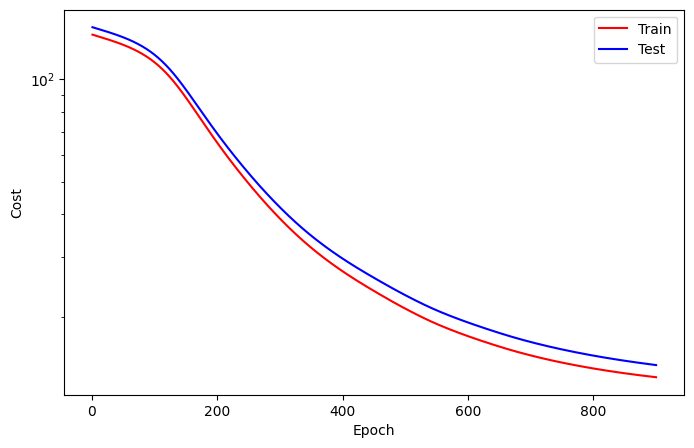

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   901
Train_cost  = 13.2658 | Test_cost  = 14.4035 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   902
Train_cost  = 13.2594 | Test_cost  = 14.3957 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   903
Train_cost  = 13.2530 | Test_cost  = 14.3880 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   904
Train_cost  = 13.2467 | Test_cost  = 14.3804 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   905
Train_cost  = 13.2404 | Test_cost  = 14.3727 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   906
Train_cost  = 13.2341 | Test_cost  = 14.3651 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   907
Train_cost  = 13.2278 | Test_cost  = 14.3575 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   908
Train_cost  = 13.2216 | Test_cost  = 14.3499 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   909
Train_cost  = 13.2154 | Test_cost  = 14.3424 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   910
Train_cost  = 13.2092 | Test_cost  = 14.3349 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   911
Train_cost  = 13.2031 | Test_cost  = 14.3274 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   912
Train_cost  = 13.1969 | Test_cost  = 14.3199 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   913
Train_cost  = 13.1908 | Test_cost  = 14.3124 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   914
Train_cost  = 13.1847 | Test_cost  = 14.3050 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   915
Train_cost  = 13.1787 | Test_cost  = 14.2976 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   916
Train_cost  = 13.1726 | Test_cost  = 14.2902 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   917
Train_cost  = 13.1666 | Test_cost  = 14.2829 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   918
Train_cost  = 13.1606 | Test_cost  = 14.2756 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   919
Train_cost  = 13.1546 | Test_cost  = 14.2683 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   920
Train_cost  = 13.1487 | Test_cost  = 14.2610 | 


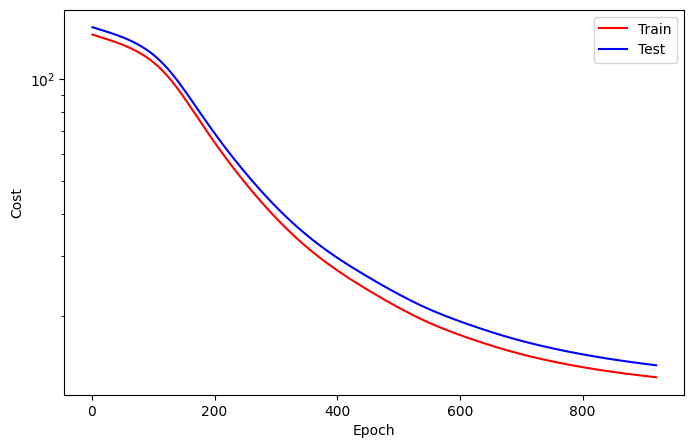

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   921
Train_cost  = 13.1428 | Test_cost  = 14.2537 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   922
Train_cost  = 13.1369 | Test_cost  = 14.2465 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   923
Train_cost  = 13.1310 | Test_cost  = 14.2393 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   924
Train_cost  = 13.1251 | Test_cost  = 14.2321 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   925
Train_cost  = 13.1193 | Test_cost  = 14.2249 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   926
Train_cost  = 13.1135 | Test_cost  = 14.2178 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   927
Train_cost  = 13.1077 | Test_cost  = 14.2106 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   928
Train_cost  = 13.1020 | Test_cost  = 14.2035 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   929
Train_cost  = 13.0962 | Test_cost  = 14.1965 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   930
Train_cost  = 13.0905 | Test_cost  = 14.1894 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   931
Train_cost  = 13.0848 | Test_cost  = 14.1824 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   932
Train_cost  = 13.0791 | Test_cost  = 14.1754 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   933
Train_cost  = 13.0735 | Test_cost  = 14.1684 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   934
Train_cost  = 13.0678 | Test_cost  = 14.1614 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   935
Train_cost  = 13.0622 | Test_cost  = 14.1545 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   936
Train_cost  = 13.0567 | Test_cost  = 14.1475 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   937
Train_cost  = 13.0511 | Test_cost  = 14.1406 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   938
Train_cost  = 13.0455 | Test_cost  = 14.1337 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   939
Train_cost  = 13.0400 | Test_cost  = 14.1269 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   940
Train_cost  = 13.0345 | Test_cost  = 14.1200 | 


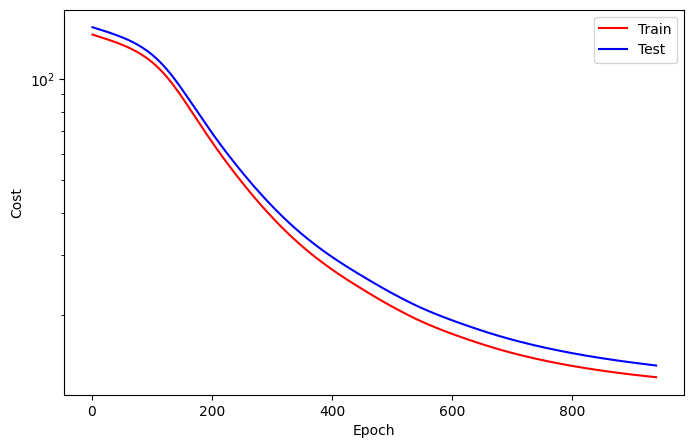

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   941
Train_cost  = 13.0291 | Test_cost  = 14.1132 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   942
Train_cost  = 13.0236 | Test_cost  = 14.1064 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   943
Train_cost  = 13.0182 | Test_cost  = 14.0997 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   944
Train_cost  = 13.0128 | Test_cost  = 14.0929 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   945
Train_cost  = 13.0074 | Test_cost  = 14.0862 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   946
Train_cost  = 13.0020 | Test_cost  = 14.0795 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   947
Train_cost  = 12.9967 | Test_cost  = 14.0729 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   948
Train_cost  = 12.9914 | Test_cost  = 14.0662 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   949
Train_cost  = 12.9861 | Test_cost  = 14.0596 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   950
Train_cost  = 12.9808 | Test_cost  = 14.0530 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   951
Train_cost  = 12.9755 | Test_cost  = 14.0464 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   952
Train_cost  = 12.9703 | Test_cost  = 14.0399 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   953
Train_cost  = 12.9651 | Test_cost  = 14.0334 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   954
Train_cost  = 12.9600 | Test_cost  = 14.0269 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   955
Train_cost  = 12.9548 | Test_cost  = 14.0205 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   956
Train_cost  = 12.9497 | Test_cost  = 14.0141 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   957
Train_cost  = 12.9446 | Test_cost  = 14.0077 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   958
Train_cost  = 12.9395 | Test_cost  = 14.0014 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   959
Train_cost  = 12.9345 | Test_cost  = 13.9950 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   960
Train_cost  = 12.9295 | Test_cost  = 13.9888 | 


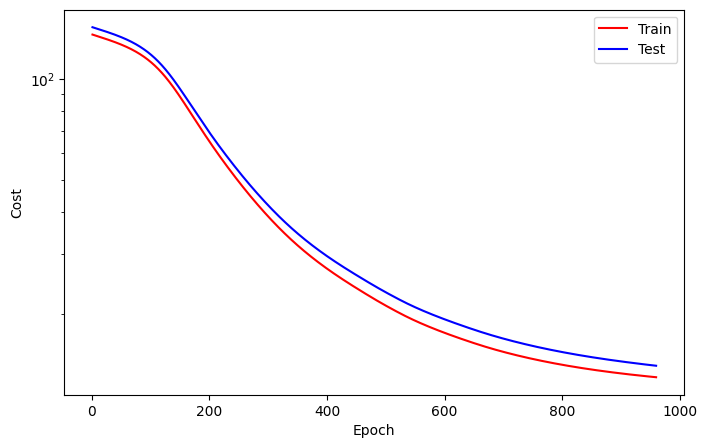

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   961
Train_cost  = 12.9245 | Test_cost  = 13.9825 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   962
Train_cost  = 12.9195 | Test_cost  = 13.9763 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   963
Train_cost  = 12.9146 | Test_cost  = 13.9701 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   964
Train_cost  = 12.9097 | Test_cost  = 13.9640 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   965
Train_cost  = 12.9048 | Test_cost  = 13.9579 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   966
Train_cost  = 12.9000 | Test_cost  = 13.9518 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   967
Train_cost  = 12.8952 | Test_cost  = 13.9458 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   968
Train_cost  = 12.8904 | Test_cost  = 13.9398 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   969
Train_cost  = 12.8856 | Test_cost  = 13.9339 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   970
Train_cost  = 12.8809 | Test_cost  = 13.9279 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   971
Train_cost  = 12.8762 | Test_cost  = 13.9221 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   972
Train_cost  = 12.8716 | Test_cost  = 13.9162 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   973
Train_cost  = 12.8669 | Test_cost  = 13.9104 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   974
Train_cost  = 12.8623 | Test_cost  = 13.9047 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   975
Train_cost  = 12.8577 | Test_cost  = 13.8989 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   976
Train_cost  = 12.8532 | Test_cost  = 13.8933 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   977
Train_cost  = 12.8487 | Test_cost  = 13.8876 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   978
Train_cost  = 12.8442 | Test_cost  = 13.8820 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   979
Train_cost  = 12.8397 | Test_cost  = 13.8764 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   980
Train_cost  = 12.8353 | Test_cost  = 13.8709 | 


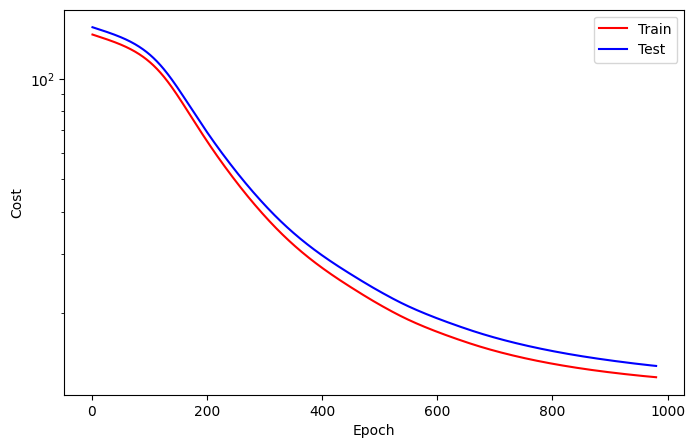

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   981
Train_cost  = 12.8309 | Test_cost  = 13.8654 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   982
Train_cost  = 12.8265 | Test_cost  = 13.8599 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   983
Train_cost  = 12.8222 | Test_cost  = 13.8545 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   984
Train_cost  = 12.8179 | Test_cost  = 13.8491 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   985
Train_cost  = 12.8136 | Test_cost  = 13.8437 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   986
Train_cost  = 12.8093 | Test_cost  = 13.8384 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   987
Train_cost  = 12.8051 | Test_cost  = 13.8331 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   988
Train_cost  = 12.8009 | Test_cost  = 13.8278 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   989
Train_cost  = 12.7967 | Test_cost  = 13.8225 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   990
Train_cost  = 12.7926 | Test_cost  = 13.8173 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   991
Train_cost  = 12.7884 | Test_cost  = 13.8121 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   992
Train_cost  = 12.7843 | Test_cost  = 13.8070 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   993
Train_cost  = 12.7803 | Test_cost  = 13.8019 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   994
Train_cost  = 12.7762 | Test_cost  = 13.7968 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   995
Train_cost  = 12.7722 | Test_cost  = 13.7917 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   996
Train_cost  = 12.7682 | Test_cost  = 13.7867 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   997
Train_cost  = 12.7642 | Test_cost  = 13.7817 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   998
Train_cost  = 12.7602 | Test_cost  = 13.7767 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch   999
Train_cost  = 12.7563 | Test_cost  = 13.7717 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1000
Train_cost  = 12.7524 | Test_cost  = 13.7668 | 


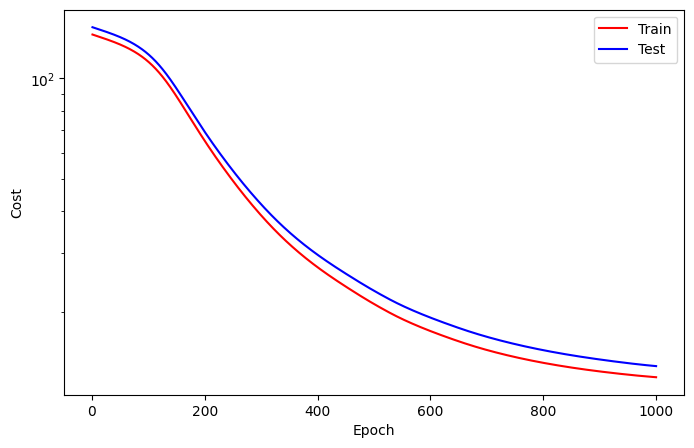

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1001
Train_cost  = 12.7485 | Test_cost  = 13.7619 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1002
Train_cost  = 12.7446 | Test_cost  = 13.7570 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1003
Train_cost  = 12.7408 | Test_cost  = 13.7522 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1004
Train_cost  = 12.7370 | Test_cost  = 13.7473 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1005
Train_cost  = 12.7332 | Test_cost  = 13.7425 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1006
Train_cost  = 12.7294 | Test_cost  = 13.7378 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1007
Train_cost  = 12.7256 | Test_cost  = 13.7330 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1008
Train_cost  = 12.7219 | Test_cost  = 13.7283 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1009
Train_cost  = 12.7182 | Test_cost  = 13.7236 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1010
Train_cost  = 12.7145 | Test_cost  = 13.7189 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1011
Train_cost  = 12.7108 | Test_cost  = 13.7142 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1012
Train_cost  = 12.7071 | Test_cost  = 13.7096 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1013
Train_cost  = 12.7035 | Test_cost  = 13.7050 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1014
Train_cost  = 12.6999 | Test_cost  = 13.7004 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1015
Train_cost  = 12.6963 | Test_cost  = 13.6958 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1016
Train_cost  = 12.6927 | Test_cost  = 13.6913 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1017
Train_cost  = 12.6892 | Test_cost  = 13.6868 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1018
Train_cost  = 12.6856 | Test_cost  = 13.6823 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1019
Train_cost  = 12.6821 | Test_cost  = 13.6778 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1020
Train_cost  = 12.6786 | Test_cost  = 13.6733 | 


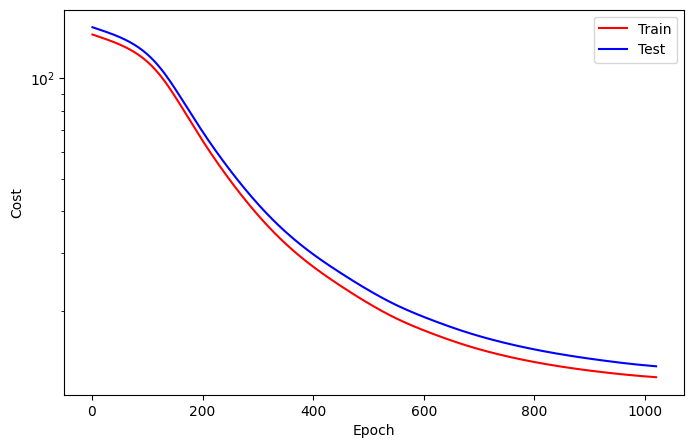

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1021
Train_cost  = 12.6751 | Test_cost  = 13.6689 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1022
Train_cost  = 12.6716 | Test_cost  = 13.6645 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1023
Train_cost  = 12.6682 | Test_cost  = 13.6601 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1024
Train_cost  = 12.6648 | Test_cost  = 13.6557 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1025
Train_cost  = 12.6614 | Test_cost  = 13.6513 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1026
Train_cost  = 12.6580 | Test_cost  = 13.6470 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1027
Train_cost  = 12.6546 | Test_cost  = 13.6427 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1028
Train_cost  = 12.6512 | Test_cost  = 13.6384 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1029
Train_cost  = 12.6479 | Test_cost  = 13.6341 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1030
Train_cost  = 12.6446 | Test_cost  = 13.6299 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1031
Train_cost  = 12.6412 | Test_cost  = 13.6256 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1032
Train_cost  = 12.6380 | Test_cost  = 13.6214 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1033
Train_cost  = 12.6347 | Test_cost  = 13.6172 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1034
Train_cost  = 12.6314 | Test_cost  = 13.6131 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1035
Train_cost  = 12.6282 | Test_cost  = 13.6089 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1036
Train_cost  = 12.6250 | Test_cost  = 13.6048 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1037
Train_cost  = 12.6218 | Test_cost  = 13.6007 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1038
Train_cost  = 12.6186 | Test_cost  = 13.5966 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1039
Train_cost  = 12.6154 | Test_cost  = 13.5925 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1040
Train_cost  = 12.6122 | Test_cost  = 13.5884 | 


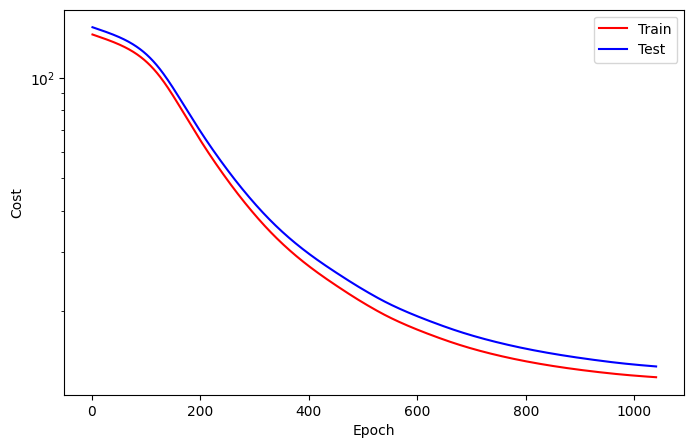

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1041
Train_cost  = 12.6091 | Test_cost  = 13.5844 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1042
Train_cost  = 12.6060 | Test_cost  = 13.5804 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1043
Train_cost  = 12.6028 | Test_cost  = 13.5763 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1044
Train_cost  = 12.5997 | Test_cost  = 13.5724 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1045
Train_cost  = 12.5967 | Test_cost  = 13.5684 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1046
Train_cost  = 12.5936 | Test_cost  = 13.5644 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1047
Train_cost  = 12.5906 | Test_cost  = 13.5605 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1048
Train_cost  = 12.5875 | Test_cost  = 13.5566 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1049
Train_cost  = 12.5845 | Test_cost  = 13.5527 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1050
Train_cost  = 12.5815 | Test_cost  = 13.5488 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1051
Train_cost  = 12.5785 | Test_cost  = 13.5449 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1052
Train_cost  = 12.5755 | Test_cost  = 13.5411 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1053
Train_cost  = 12.5726 | Test_cost  = 13.5373 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1054
Train_cost  = 12.5696 | Test_cost  = 13.5334 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1055
Train_cost  = 12.5667 | Test_cost  = 13.5296 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1056
Train_cost  = 12.5638 | Test_cost  = 13.5259 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1057
Train_cost  = 12.5609 | Test_cost  = 13.5221 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1058
Train_cost  = 12.5580 | Test_cost  = 13.5184 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1059
Train_cost  = 12.5551 | Test_cost  = 13.5146 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1060
Train_cost  = 12.5522 | Test_cost  = 13.5109 | 


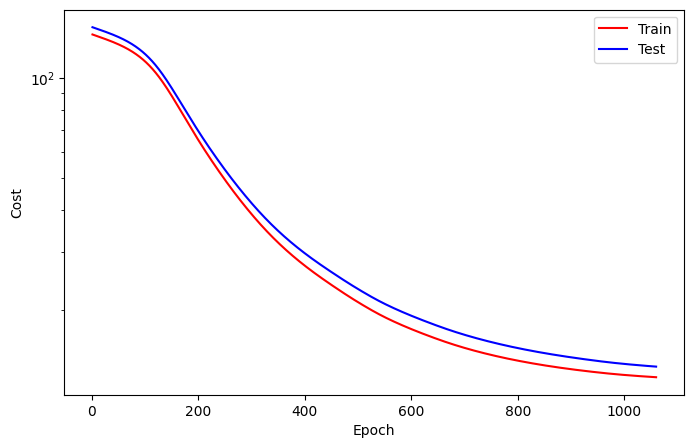

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1061
Train_cost  = 12.5494 | Test_cost  = 13.5072 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1062
Train_cost  = 12.5466 | Test_cost  = 13.5035 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1063
Train_cost  = 12.5437 | Test_cost  = 13.4999 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1064
Train_cost  = 12.5409 | Test_cost  = 13.4962 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1065
Train_cost  = 12.5381 | Test_cost  = 13.4926 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1066
Train_cost  = 12.5353 | Test_cost  = 13.4889 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1067
Train_cost  = 12.5326 | Test_cost  = 13.4853 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1068
Train_cost  = 12.5298 | Test_cost  = 13.4817 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1069
Train_cost  = 12.5271 | Test_cost  = 13.4782 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1070
Train_cost  = 12.5244 | Test_cost  = 13.4746 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1071
Train_cost  = 12.5216 | Test_cost  = 13.4711 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1072
Train_cost  = 12.5189 | Test_cost  = 13.4675 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1073
Train_cost  = 12.5162 | Test_cost  = 13.4640 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1074
Train_cost  = 12.5136 | Test_cost  = 13.4605 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1075
Train_cost  = 12.5109 | Test_cost  = 13.4570 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1076
Train_cost  = 12.5082 | Test_cost  = 13.4535 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1077
Train_cost  = 12.5056 | Test_cost  = 13.4501 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1078
Train_cost  = 12.5030 | Test_cost  = 13.4466 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1079
Train_cost  = 12.5004 | Test_cost  = 13.4432 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1080
Train_cost  = 12.4977 | Test_cost  = 13.4398 | 


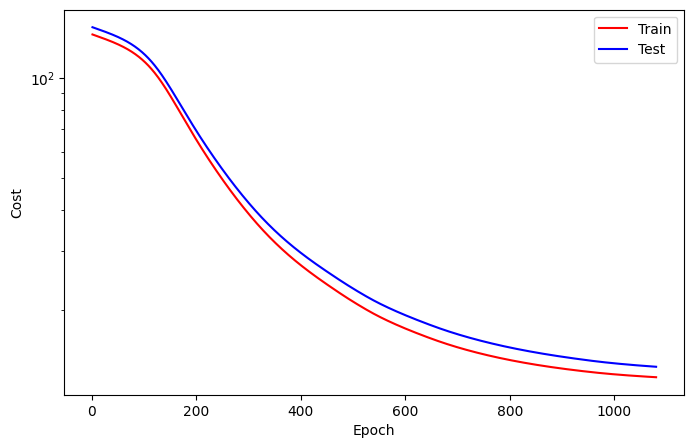

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1081
Train_cost  = 12.4952 | Test_cost  = 13.4364 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1082
Train_cost  = 12.4926 | Test_cost  = 13.4330 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1083
Train_cost  = 12.4900 | Test_cost  = 13.4296 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1084
Train_cost  = 12.4874 | Test_cost  = 13.4262 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1085
Train_cost  = 12.4849 | Test_cost  = 13.4229 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1086
Train_cost  = 12.4823 | Test_cost  = 13.4196 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1087
Train_cost  = 12.4798 | Test_cost  = 13.4162 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1088
Train_cost  = 12.4773 | Test_cost  = 13.4129 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1089
Train_cost  = 12.4748 | Test_cost  = 13.4096 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1090
Train_cost  = 12.4723 | Test_cost  = 13.4063 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1091
Train_cost  = 12.4698 | Test_cost  = 13.4030 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1092
Train_cost  = 12.4674 | Test_cost  = 13.3998 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1093
Train_cost  = 12.4649 | Test_cost  = 13.3965 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1094
Train_cost  = 12.4624 | Test_cost  = 13.3933 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1095
Train_cost  = 12.4600 | Test_cost  = 13.3901 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1096
Train_cost  = 12.4576 | Test_cost  = 13.3868 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1097
Train_cost  = 12.4551 | Test_cost  = 13.3836 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1098
Train_cost  = 12.4527 | Test_cost  = 13.3804 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1099
Train_cost  = 12.4503 | Test_cost  = 13.3773 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1100
Train_cost  = 12.4479 | Test_cost  = 13.3741 | 


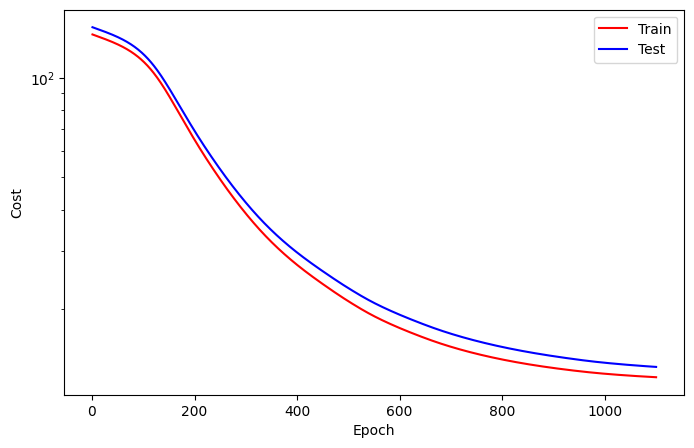

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1101
Train_cost  = 12.4455 | Test_cost  = 13.3709 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1102
Train_cost  = 12.4432 | Test_cost  = 13.3678 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1103
Train_cost  = 12.4408 | Test_cost  = 13.3646 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1104
Train_cost  = 12.4385 | Test_cost  = 13.3615 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1105
Train_cost  = 12.4361 | Test_cost  = 13.3584 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1106
Train_cost  = 12.4338 | Test_cost  = 13.3553 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1107
Train_cost  = 12.4314 | Test_cost  = 13.3522 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1108
Train_cost  = 12.4291 | Test_cost  = 13.3491 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1109
Train_cost  = 12.4268 | Test_cost  = 13.3460 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1110
Train_cost  = 12.4245 | Test_cost  = 13.3429 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1111
Train_cost  = 12.4222 | Test_cost  = 13.3399 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1112
Train_cost  = 12.4199 | Test_cost  = 13.3368 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1113
Train_cost  = 12.4177 | Test_cost  = 13.3338 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1114
Train_cost  = 12.4154 | Test_cost  = 13.3308 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1115
Train_cost  = 12.4131 | Test_cost  = 13.3278 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1116
Train_cost  = 12.4109 | Test_cost  = 13.3247 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1117
Train_cost  = 12.4086 | Test_cost  = 13.3217 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1118
Train_cost  = 12.4064 | Test_cost  = 13.3187 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1119
Train_cost  = 12.4042 | Test_cost  = 13.3158 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1120
Train_cost  = 12.4020 | Test_cost  = 13.3128 | 


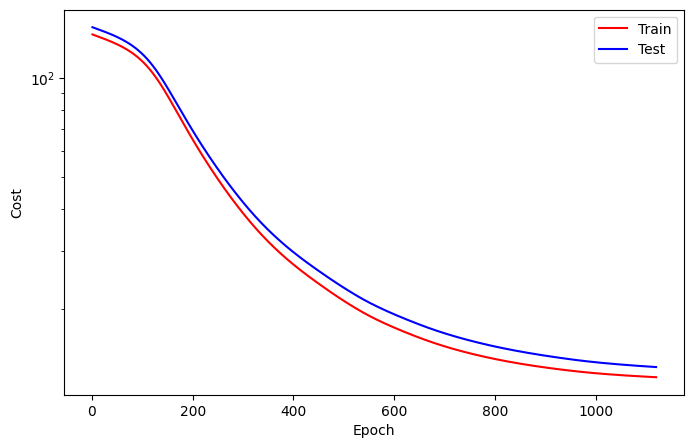

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1121
Train_cost  = 12.3997 | Test_cost  = 13.3098 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1122
Train_cost  = 12.3975 | Test_cost  = 13.3068 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1123
Train_cost  = 12.3954 | Test_cost  = 13.3039 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1124
Train_cost  = 12.3932 | Test_cost  = 13.3010 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1125
Train_cost  = 12.3910 | Test_cost  = 13.2980 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1126
Train_cost  = 12.3888 | Test_cost  = 13.2951 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1127
Train_cost  = 12.3866 | Test_cost  = 13.2922 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1128
Train_cost  = 12.3845 | Test_cost  = 13.2893 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1129
Train_cost  = 12.3823 | Test_cost  = 13.2864 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1130
Train_cost  = 12.3802 | Test_cost  = 13.2835 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1131
Train_cost  = 12.3780 | Test_cost  = 13.2806 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1132
Train_cost  = 12.3759 | Test_cost  = 13.2777 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1133
Train_cost  = 12.3738 | Test_cost  = 13.2748 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1134
Train_cost  = 12.3717 | Test_cost  = 13.2720 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1135
Train_cost  = 12.3696 | Test_cost  = 13.2691 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1136
Train_cost  = 12.3675 | Test_cost  = 13.2663 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1137
Train_cost  = 12.3654 | Test_cost  = 13.2634 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1138
Train_cost  = 12.3633 | Test_cost  = 13.2606 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1139
Train_cost  = 12.3612 | Test_cost  = 13.2578 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1140
Train_cost  = 12.3591 | Test_cost  = 13.2549 | 


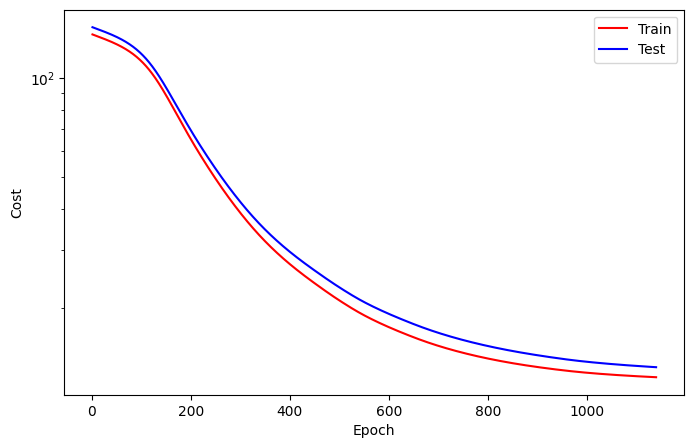

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1141
Train_cost  = 12.3570 | Test_cost  = 13.2521 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1142
Train_cost  = 12.3550 | Test_cost  = 13.2493 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1143
Train_cost  = 12.3529 | Test_cost  = 13.2465 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1144
Train_cost  = 12.3509 | Test_cost  = 13.2437 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1145
Train_cost  = 12.3488 | Test_cost  = 13.2410 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1146
Train_cost  = 12.3468 | Test_cost  = 13.2382 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1147
Train_cost  = 12.3448 | Test_cost  = 13.2354 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1148
Train_cost  = 12.3427 | Test_cost  = 13.2327 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1149
Train_cost  = 12.3407 | Test_cost  = 13.2299 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1150
Train_cost  = 12.3387 | Test_cost  = 13.2272 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1151
Train_cost  = 12.3367 | Test_cost  = 13.2245 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1152
Train_cost  = 12.3347 | Test_cost  = 13.2217 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1153
Train_cost  = 12.3327 | Test_cost  = 13.2190 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1154
Train_cost  = 12.3307 | Test_cost  = 13.2163 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1155
Train_cost  = 12.3288 | Test_cost  = 13.2136 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1156
Train_cost  = 12.3268 | Test_cost  = 13.2109 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1157
Train_cost  = 12.3248 | Test_cost  = 13.2083 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1158
Train_cost  = 12.3229 | Test_cost  = 13.2056 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1159
Train_cost  = 12.3210 | Test_cost  = 13.2029 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1160
Train_cost  = 12.3190 | Test_cost  = 13.2003 | 


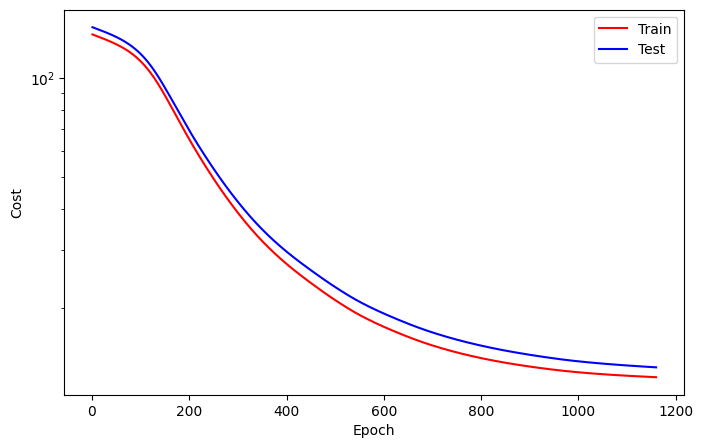

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1161
Train_cost  = 12.3171 | Test_cost  = 13.1976 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1162
Train_cost  = 12.3152 | Test_cost  = 13.1950 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1163
Train_cost  = 12.3132 | Test_cost  = 13.1924 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1164
Train_cost  = 12.3113 | Test_cost  = 13.1897 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1165
Train_cost  = 12.3094 | Test_cost  = 13.1871 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1166
Train_cost  = 12.3075 | Test_cost  = 13.1845 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1167
Train_cost  = 12.3056 | Test_cost  = 13.1820 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1168
Train_cost  = 12.3038 | Test_cost  = 13.1794 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1169
Train_cost  = 12.3019 | Test_cost  = 13.1768 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1170
Train_cost  = 12.3000 | Test_cost  = 13.1742 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1171
Train_cost  = 12.2982 | Test_cost  = 13.1717 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1172
Train_cost  = 12.2963 | Test_cost  = 13.1692 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1173
Train_cost  = 12.2945 | Test_cost  = 13.1666 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1174
Train_cost  = 12.2927 | Test_cost  = 13.1641 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1175
Train_cost  = 12.2908 | Test_cost  = 13.1616 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1176
Train_cost  = 12.2890 | Test_cost  = 13.1591 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1177
Train_cost  = 12.2872 | Test_cost  = 13.1566 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1178
Train_cost  = 12.2854 | Test_cost  = 13.1541 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1179
Train_cost  = 12.2836 | Test_cost  = 13.1517 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1180
Train_cost  = 12.2818 | Test_cost  = 13.1492 | 


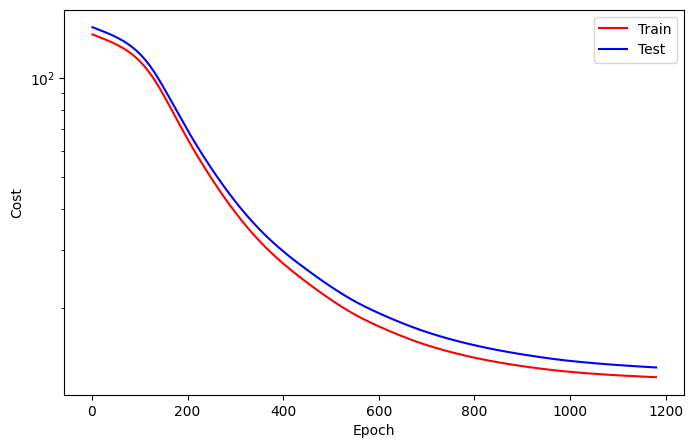

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1181
Train_cost  = 12.2800 | Test_cost  = 13.1467 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1182
Train_cost  = 12.2783 | Test_cost  = 13.1443 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1183
Train_cost  = 12.2765 | Test_cost  = 13.1419 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1184
Train_cost  = 12.2747 | Test_cost  = 13.1394 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1185
Train_cost  = 12.2730 | Test_cost  = 13.1370 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1186
Train_cost  = 12.2712 | Test_cost  = 13.1346 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1187
Train_cost  = 12.2695 | Test_cost  = 13.1322 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1188
Train_cost  = 12.2678 | Test_cost  = 13.1298 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1189
Train_cost  = 12.2660 | Test_cost  = 13.1275 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1190
Train_cost  = 12.2643 | Test_cost  = 13.1251 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1191
Train_cost  = 12.2626 | Test_cost  = 13.1227 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1192
Train_cost  = 12.2609 | Test_cost  = 13.1204 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1193
Train_cost  = 12.2592 | Test_cost  = 13.1181 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1194
Train_cost  = 12.2575 | Test_cost  = 13.1157 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1195
Train_cost  = 12.2558 | Test_cost  = 13.1134 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1196
Train_cost  = 12.2541 | Test_cost  = 13.1111 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1197
Train_cost  = 12.2525 | Test_cost  = 13.1088 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1198
Train_cost  = 12.2508 | Test_cost  = 13.1065 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1199
Train_cost  = 12.2491 | Test_cost  = 13.1042 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1200
Train_cost  = 12.2475 | Test_cost  = 13.1019 | 


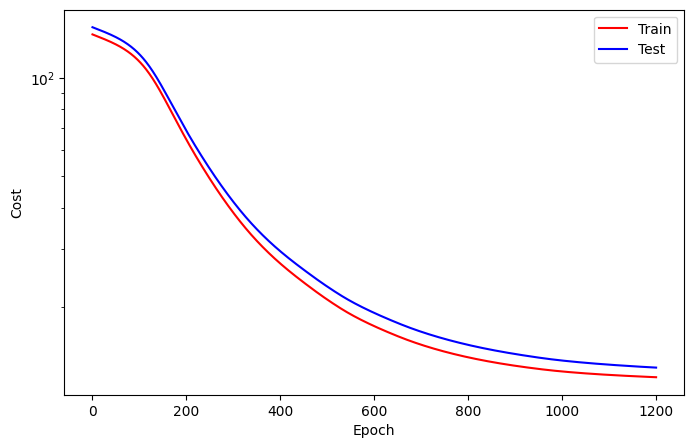

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1201
Train_cost  = 12.2458 | Test_cost  = 13.0996 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1202
Train_cost  = 12.2442 | Test_cost  = 13.0974 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1203
Train_cost  = 12.2426 | Test_cost  = 13.0951 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1204
Train_cost  = 12.2409 | Test_cost  = 13.0929 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1205
Train_cost  = 12.2393 | Test_cost  = 13.0906 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1206
Train_cost  = 12.2377 | Test_cost  = 13.0884 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1207
Train_cost  = 12.2360 | Test_cost  = 13.0862 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1208
Train_cost  = 12.2344 | Test_cost  = 13.0839 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1209
Train_cost  = 12.2328 | Test_cost  = 13.0817 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1210
Train_cost  = 12.2312 | Test_cost  = 13.0795 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1211
Train_cost  = 12.2296 | Test_cost  = 13.0773 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1212
Train_cost  = 12.2280 | Test_cost  = 13.0751 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1213
Train_cost  = 12.2264 | Test_cost  = 13.0729 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1214
Train_cost  = 12.2248 | Test_cost  = 13.0707 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1215
Train_cost  = 12.2232 | Test_cost  = 13.0686 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1216
Train_cost  = 12.2216 | Test_cost  = 13.0664 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1217
Train_cost  = 12.2201 | Test_cost  = 13.0642 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1218
Train_cost  = 12.2185 | Test_cost  = 13.0620 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1219
Train_cost  = 12.2169 | Test_cost  = 13.0599 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1220
Train_cost  = 12.2153 | Test_cost  = 13.0577 | 


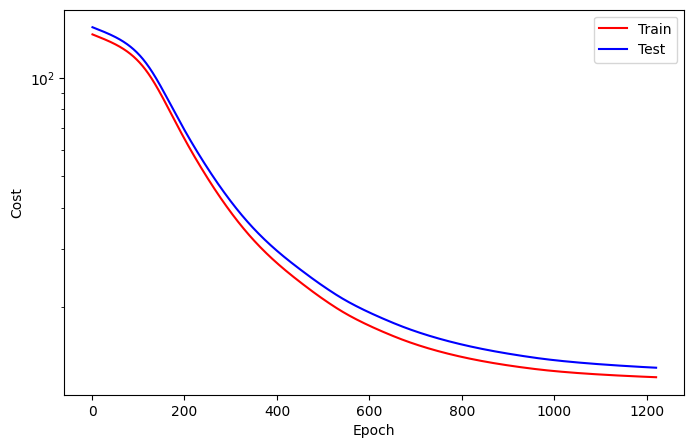

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1221
Train_cost  = 12.2138 | Test_cost  = 13.0556 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1222
Train_cost  = 12.2122 | Test_cost  = 13.0534 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1223
Train_cost  = 12.2106 | Test_cost  = 13.0513 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1224
Train_cost  = 12.2091 | Test_cost  = 13.0492 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1225
Train_cost  = 12.2075 | Test_cost  = 13.0470 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1226
Train_cost  = 12.2060 | Test_cost  = 13.0449 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1227
Train_cost  = 12.2044 | Test_cost  = 13.0428 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1228
Train_cost  = 12.2028 | Test_cost  = 13.0406 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1229
Train_cost  = 12.2013 | Test_cost  = 13.0385 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1230
Train_cost  = 12.1997 | Test_cost  = 13.0364 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1231
Train_cost  = 12.1982 | Test_cost  = 13.0343 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1232
Train_cost  = 12.1966 | Test_cost  = 13.0322 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1233
Train_cost  = 12.1951 | Test_cost  = 13.0301 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1234
Train_cost  = 12.1936 | Test_cost  = 13.0280 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1235
Train_cost  = 12.1920 | Test_cost  = 13.0259 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1236
Train_cost  = 12.1905 | Test_cost  = 13.0238 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1237
Train_cost  = 12.1889 | Test_cost  = 13.0217 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1238
Train_cost  = 12.1874 | Test_cost  = 13.0196 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1239
Train_cost  = 12.1859 | Test_cost  = 13.0175 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1240
Train_cost  = 12.1843 | Test_cost  = 13.0154 | 


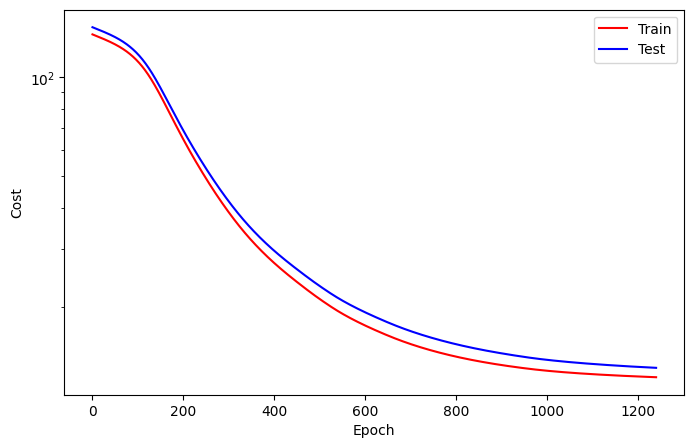

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1241
Train_cost  = 12.1828 | Test_cost  = 13.0133 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1242
Train_cost  = 12.1812 | Test_cost  = 13.0112 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1243
Train_cost  = 12.1797 | Test_cost  = 13.0091 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1244
Train_cost  = 12.1782 | Test_cost  = 13.0070 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1245
Train_cost  = 12.1767 | Test_cost  = 13.0049 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1246
Train_cost  = 12.1751 | Test_cost  = 13.0028 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1247
Train_cost  = 12.1736 | Test_cost  = 13.0008 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1248
Train_cost  = 12.1721 | Test_cost  = 12.9987 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1249
Train_cost  = 12.1705 | Test_cost  = 12.9966 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1250
Train_cost  = 12.1690 | Test_cost  = 12.9945 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1251
Train_cost  = 12.1675 | Test_cost  = 12.9924 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1252
Train_cost  = 12.1660 | Test_cost  = 12.9904 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1253
Train_cost  = 12.1644 | Test_cost  = 12.9883 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1254
Train_cost  = 12.1629 | Test_cost  = 12.9862 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1255
Train_cost  = 12.1614 | Test_cost  = 12.9841 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1256
Train_cost  = 12.1599 | Test_cost  = 12.9820 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1257
Train_cost  = 12.1583 | Test_cost  = 12.9800 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1258
Train_cost  = 12.1568 | Test_cost  = 12.9779 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1259
Train_cost  = 12.1553 | Test_cost  = 12.9758 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1260
Train_cost  = 12.1538 | Test_cost  = 12.9737 | 


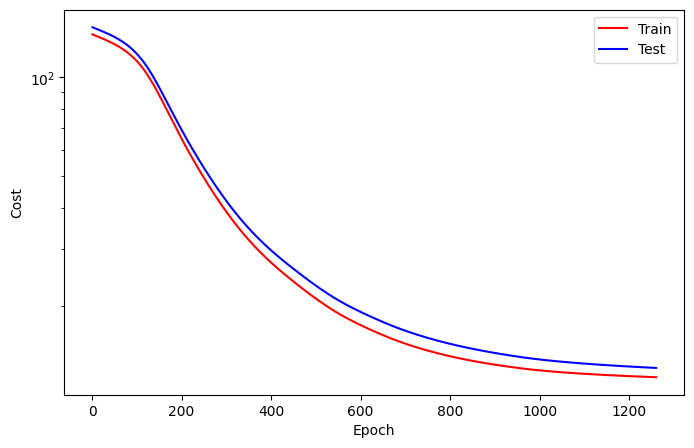

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1261
Train_cost  = 12.1522 | Test_cost  = 12.9717 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1262
Train_cost  = 12.1507 | Test_cost  = 12.9696 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1263
Train_cost  = 12.1492 | Test_cost  = 12.9675 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1264
Train_cost  = 12.1477 | Test_cost  = 12.9654 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1265
Train_cost  = 12.1462 | Test_cost  = 12.9633 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1266
Train_cost  = 12.1447 | Test_cost  = 12.9613 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1267
Train_cost  = 12.1431 | Test_cost  = 12.9592 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1268
Train_cost  = 12.1416 | Test_cost  = 12.9571 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1269
Train_cost  = 12.1401 | Test_cost  = 12.9550 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1270
Train_cost  = 12.1386 | Test_cost  = 12.9529 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1271
Train_cost  = 12.1371 | Test_cost  = 12.9509 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1272
Train_cost  = 12.1356 | Test_cost  = 12.9488 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1273
Train_cost  = 12.1341 | Test_cost  = 12.9467 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1274
Train_cost  = 12.1326 | Test_cost  = 12.9446 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1275
Train_cost  = 12.1311 | Test_cost  = 12.9425 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1276
Train_cost  = 12.1296 | Test_cost  = 12.9405 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1277
Train_cost  = 12.1281 | Test_cost  = 12.9384 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1278
Train_cost  = 12.1266 | Test_cost  = 12.9363 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1279
Train_cost  = 12.1251 | Test_cost  = 12.9342 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1280
Train_cost  = 12.1235 | Test_cost  = 12.9321 | 


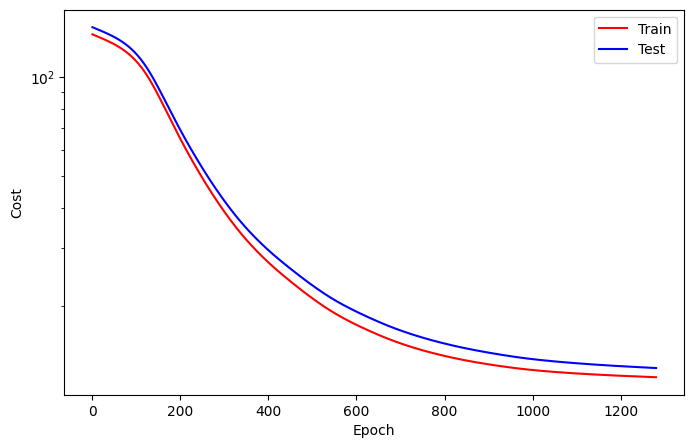

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1281
Train_cost  = 12.1221 | Test_cost  = 12.9300 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1282
Train_cost  = 12.1206 | Test_cost  = 12.9280 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1283
Train_cost  = 12.1191 | Test_cost  = 12.9259 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1284
Train_cost  = 12.1176 | Test_cost  = 12.9238 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1285
Train_cost  = 12.1161 | Test_cost  = 12.9217 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1286
Train_cost  = 12.1146 | Test_cost  = 12.9196 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1287
Train_cost  = 12.1131 | Test_cost  = 12.9176 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1288
Train_cost  = 12.1116 | Test_cost  = 12.9155 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1289
Train_cost  = 12.1101 | Test_cost  = 12.9134 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1290
Train_cost  = 12.1087 | Test_cost  = 12.9113 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1291
Train_cost  = 12.1072 | Test_cost  = 12.9093 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1292
Train_cost  = 12.1057 | Test_cost  = 12.9072 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1293
Train_cost  = 12.1042 | Test_cost  = 12.9051 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1294
Train_cost  = 12.1028 | Test_cost  = 12.9030 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1295
Train_cost  = 12.1013 | Test_cost  = 12.9010 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1296
Train_cost  = 12.0998 | Test_cost  = 12.8989 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1297
Train_cost  = 12.0984 | Test_cost  = 12.8968 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1298
Train_cost  = 12.0969 | Test_cost  = 12.8948 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1299
Train_cost  = 12.0955 | Test_cost  = 12.8927 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1300
Train_cost  = 12.0940 | Test_cost  = 12.8907 | 


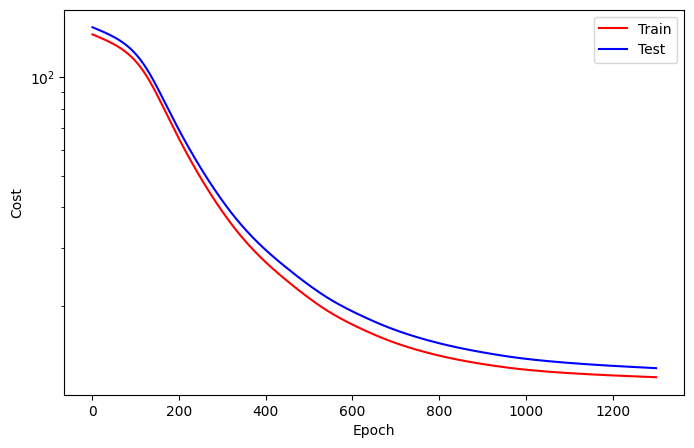

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1301
Train_cost  = 12.0926 | Test_cost  = 12.8886 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1302
Train_cost  = 12.0912 | Test_cost  = 12.8866 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1303
Train_cost  = 12.0897 | Test_cost  = 12.8846 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1304
Train_cost  = 12.0883 | Test_cost  = 12.8825 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1305
Train_cost  = 12.0869 | Test_cost  = 12.8805 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1306
Train_cost  = 12.0855 | Test_cost  = 12.8785 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1307
Train_cost  = 12.0841 | Test_cost  = 12.8765 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1308
Train_cost  = 12.0827 | Test_cost  = 12.8745 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1309
Train_cost  = 12.0813 | Test_cost  = 12.8725 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1310
Train_cost  = 12.0799 | Test_cost  = 12.8705 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1311
Train_cost  = 12.0785 | Test_cost  = 12.8685 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1312
Train_cost  = 12.0771 | Test_cost  = 12.8665 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1313
Train_cost  = 12.0758 | Test_cost  = 12.8646 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1314
Train_cost  = 12.0744 | Test_cost  = 12.8626 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1315
Train_cost  = 12.0730 | Test_cost  = 12.8607 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1316
Train_cost  = 12.0717 | Test_cost  = 12.8587 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1317
Train_cost  = 12.0703 | Test_cost  = 12.8568 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1318
Train_cost  = 12.0690 | Test_cost  = 12.8549 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1319
Train_cost  = 12.0677 | Test_cost  = 12.8529 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1320
Train_cost  = 12.0664 | Test_cost  = 12.8510 | 


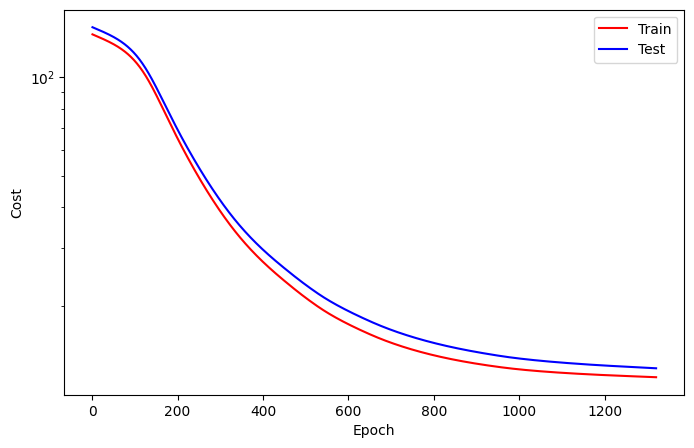

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1321
Train_cost  = 12.0651 | Test_cost  = 12.8491 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1322
Train_cost  = 12.0637 | Test_cost  = 12.8473 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1323
Train_cost  = 12.0625 | Test_cost  = 12.8454 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1324
Train_cost  = 12.0612 | Test_cost  = 12.8435 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1325
Train_cost  = 12.0599 | Test_cost  = 12.8417 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1326
Train_cost  = 12.0586 | Test_cost  = 12.8398 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1327
Train_cost  = 12.0573 | Test_cost  = 12.8380 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1328
Train_cost  = 12.0561 | Test_cost  = 12.8361 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1329
Train_cost  = 12.0548 | Test_cost  = 12.8343 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1330
Train_cost  = 12.0536 | Test_cost  = 12.8325 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1331
Train_cost  = 12.0523 | Test_cost  = 12.8307 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1332
Train_cost  = 12.0511 | Test_cost  = 12.8289 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1333
Train_cost  = 12.0499 | Test_cost  = 12.8272 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1334
Train_cost  = 12.0487 | Test_cost  = 12.8254 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1335
Train_cost  = 12.0475 | Test_cost  = 12.8236 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1336
Train_cost  = 12.0462 | Test_cost  = 12.8219 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1337
Train_cost  = 12.0450 | Test_cost  = 12.8202 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1338
Train_cost  = 12.0439 | Test_cost  = 12.8184 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1339
Train_cost  = 12.0427 | Test_cost  = 12.8167 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1340
Train_cost  = 12.0415 | Test_cost  = 12.8150 | 


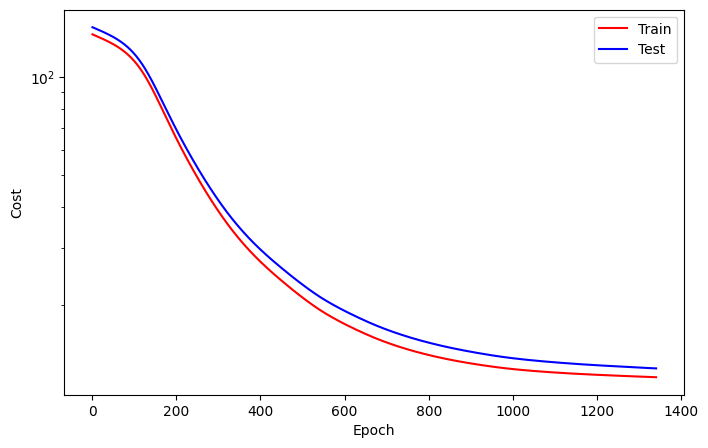

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1341
Train_cost  = 12.0403 | Test_cost  = 12.8133 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1342
Train_cost  = 12.0392 | Test_cost  = 12.8116 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1343
Train_cost  = 12.0380 | Test_cost  = 12.8099 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1344
Train_cost  = 12.0368 | Test_cost  = 12.8083 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1345
Train_cost  = 12.0357 | Test_cost  = 12.8066 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1346
Train_cost  = 12.0345 | Test_cost  = 12.8050 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1347
Train_cost  = 12.0334 | Test_cost  = 12.8033 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1348
Train_cost  = 12.0323 | Test_cost  = 12.8017 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1349
Train_cost  = 12.0311 | Test_cost  = 12.8000 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1350
Train_cost  = 12.0300 | Test_cost  = 12.7984 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1351
Train_cost  = 12.0289 | Test_cost  = 12.7968 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1352
Train_cost  = 12.0278 | Test_cost  = 12.7952 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1353
Train_cost  = 12.0266 | Test_cost  = 12.7936 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1354
Train_cost  = 12.0255 | Test_cost  = 12.7920 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1355
Train_cost  = 12.0244 | Test_cost  = 12.7904 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1356
Train_cost  = 12.0233 | Test_cost  = 12.7889 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1357
Train_cost  = 12.0222 | Test_cost  = 12.7873 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1358
Train_cost  = 12.0211 | Test_cost  = 12.7857 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1359
Train_cost  = 12.0200 | Test_cost  = 12.7842 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1360
Train_cost  = 12.0189 | Test_cost  = 12.7826 | 


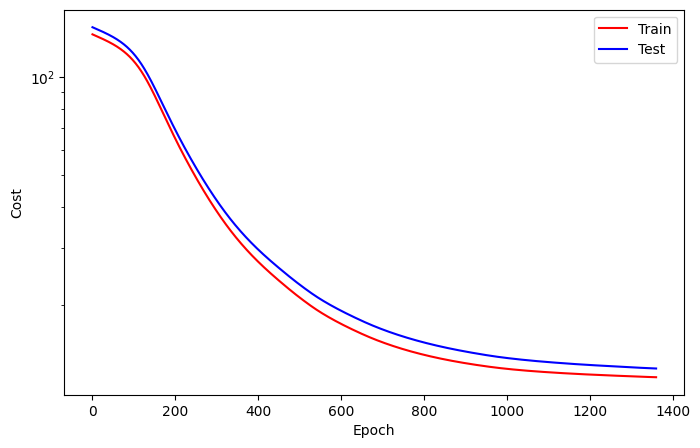

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1361
Train_cost  = 12.0179 | Test_cost  = 12.7811 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1362
Train_cost  = 12.0168 | Test_cost  = 12.7795 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1363
Train_cost  = 12.0157 | Test_cost  = 12.7780 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1364
Train_cost  = 12.0146 | Test_cost  = 12.7765 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1365
Train_cost  = 12.0135 | Test_cost  = 12.7750 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1366
Train_cost  = 12.0125 | Test_cost  = 12.7734 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1367
Train_cost  = 12.0114 | Test_cost  = 12.7719 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1368
Train_cost  = 12.0103 | Test_cost  = 12.7704 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1369
Train_cost  = 12.0093 | Test_cost  = 12.7689 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1370
Train_cost  = 12.0082 | Test_cost  = 12.7674 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1371
Train_cost  = 12.0072 | Test_cost  = 12.7659 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1372
Train_cost  = 12.0061 | Test_cost  = 12.7645 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1373
Train_cost  = 12.0050 | Test_cost  = 12.7630 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1374
Train_cost  = 12.0040 | Test_cost  = 12.7615 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1375
Train_cost  = 12.0029 | Test_cost  = 12.7600 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1376
Train_cost  = 12.0019 | Test_cost  = 12.7586 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1377
Train_cost  = 12.0008 | Test_cost  = 12.7571 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1378
Train_cost  = 11.9998 | Test_cost  = 12.7556 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1379
Train_cost  = 11.9987 | Test_cost  = 12.7542 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1380
Train_cost  = 11.9977 | Test_cost  = 12.7527 | 


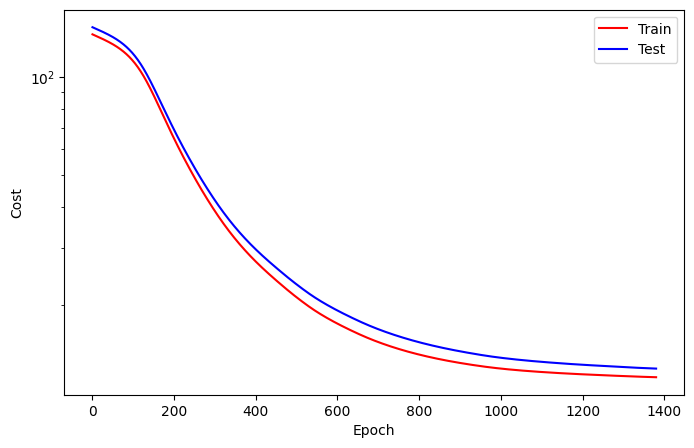

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1381
Train_cost  = 11.9967 | Test_cost  = 12.7513 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1382
Train_cost  = 11.9956 | Test_cost  = 12.7498 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1383
Train_cost  = 11.9946 | Test_cost  = 12.7484 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1384
Train_cost  = 11.9935 | Test_cost  = 12.7469 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1385
Train_cost  = 11.9925 | Test_cost  = 12.7455 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1386
Train_cost  = 11.9915 | Test_cost  = 12.7440 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1387
Train_cost  = 11.9904 | Test_cost  = 12.7426 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1388
Train_cost  = 11.9894 | Test_cost  = 12.7412 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1389
Train_cost  = 11.9884 | Test_cost  = 12.7397 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1390
Train_cost  = 11.9873 | Test_cost  = 12.7383 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1391
Train_cost  = 11.9863 | Test_cost  = 12.7369 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1392
Train_cost  = 11.9853 | Test_cost  = 12.7355 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1393
Train_cost  = 11.9842 | Test_cost  = 12.7340 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1394
Train_cost  = 11.9832 | Test_cost  = 12.7326 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1395
Train_cost  = 11.9822 | Test_cost  = 12.7312 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1396
Train_cost  = 11.9811 | Test_cost  = 12.7298 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1397
Train_cost  = 11.9801 | Test_cost  = 12.7284 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1398
Train_cost  = 11.9791 | Test_cost  = 12.7270 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1399
Train_cost  = 11.9781 | Test_cost  = 12.7255 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1400
Train_cost  = 11.9770 | Test_cost  = 12.7241 | 


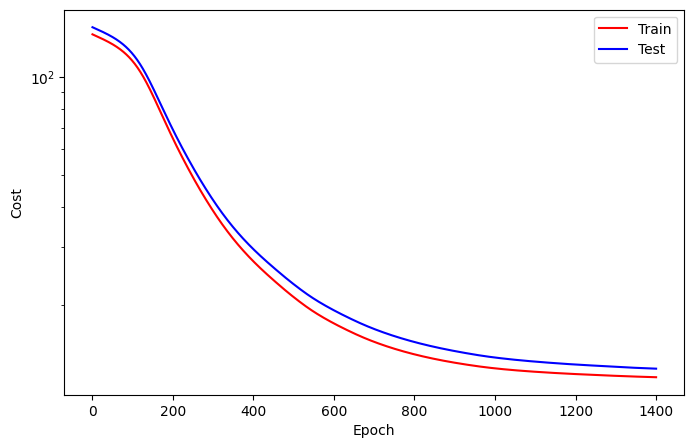

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1401
Train_cost  = 11.9760 | Test_cost  = 12.7227 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1402
Train_cost  = 11.9750 | Test_cost  = 12.7213 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1403
Train_cost  = 11.9739 | Test_cost  = 12.7199 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1404
Train_cost  = 11.9729 | Test_cost  = 12.7185 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1405
Train_cost  = 11.9719 | Test_cost  = 12.7171 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1406
Train_cost  = 11.9708 | Test_cost  = 12.7156 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1407
Train_cost  = 11.9698 | Test_cost  = 12.7142 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1408
Train_cost  = 11.9688 | Test_cost  = 12.7128 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1409
Train_cost  = 11.9677 | Test_cost  = 12.7114 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1410
Train_cost  = 11.9667 | Test_cost  = 12.7100 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1411
Train_cost  = 11.9656 | Test_cost  = 12.7086 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1412
Train_cost  = 11.9646 | Test_cost  = 12.7072 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1413
Train_cost  = 11.9636 | Test_cost  = 12.7057 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1414
Train_cost  = 11.9625 | Test_cost  = 12.7043 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1415
Train_cost  = 11.9615 | Test_cost  = 12.7029 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1416
Train_cost  = 11.9604 | Test_cost  = 12.7015 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1417
Train_cost  = 11.9594 | Test_cost  = 12.7001 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1418
Train_cost  = 11.9583 | Test_cost  = 12.6986 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1419
Train_cost  = 11.9573 | Test_cost  = 12.6972 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1420
Train_cost  = 11.9562 | Test_cost  = 12.6958 | 


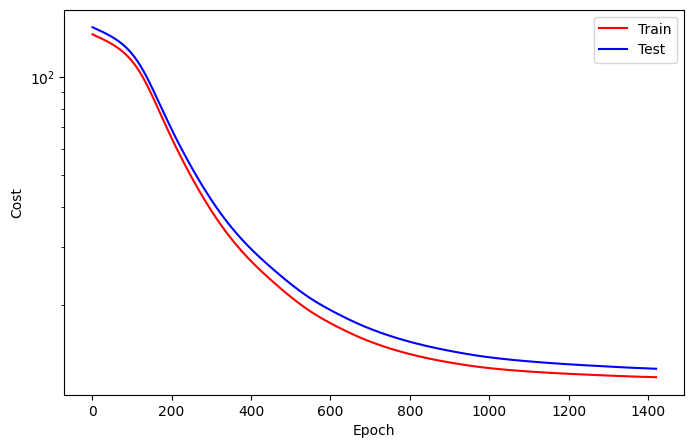

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1421
Train_cost  = 11.9552 | Test_cost  = 12.6944 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1422
Train_cost  = 11.9541 | Test_cost  = 12.6929 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1423
Train_cost  = 11.9530 | Test_cost  = 12.6915 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1424
Train_cost  = 11.9520 | Test_cost  = 12.6901 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1425
Train_cost  = 11.9509 | Test_cost  = 12.6886 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1426
Train_cost  = 11.9498 | Test_cost  = 12.6872 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1427
Train_cost  = 11.9488 | Test_cost  = 12.6857 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1428
Train_cost  = 11.9477 | Test_cost  = 12.6843 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1429
Train_cost  = 11.9466 | Test_cost  = 12.6828 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1430
Train_cost  = 11.9455 | Test_cost  = 12.6814 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1431
Train_cost  = 11.9444 | Test_cost  = 12.6799 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1432
Train_cost  = 11.9433 | Test_cost  = 12.6785 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1433
Train_cost  = 11.9422 | Test_cost  = 12.6770 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1434
Train_cost  = 11.9411 | Test_cost  = 12.6755 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1435
Train_cost  = 11.9400 | Test_cost  = 12.6740 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1436
Train_cost  = 11.9389 | Test_cost  = 12.6726 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1437
Train_cost  = 11.9378 | Test_cost  = 12.6711 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1438
Train_cost  = 11.9367 | Test_cost  = 12.6696 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1439
Train_cost  = 11.9355 | Test_cost  = 12.6681 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1440
Train_cost  = 11.9344 | Test_cost  = 12.6666 | 


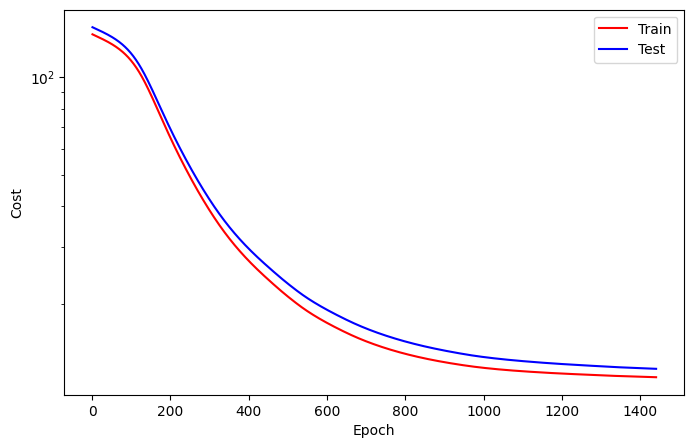

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1441
Train_cost  = 11.9333 | Test_cost  = 12.6651 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1442
Train_cost  = 11.9321 | Test_cost  = 12.6636 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1443
Train_cost  = 11.9310 | Test_cost  = 12.6621 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1444
Train_cost  = 11.9298 | Test_cost  = 12.6606 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1445
Train_cost  = 11.9287 | Test_cost  = 12.6590 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1446
Train_cost  = 11.9275 | Test_cost  = 12.6575 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1447
Train_cost  = 11.9264 | Test_cost  = 12.6560 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1448
Train_cost  = 11.9252 | Test_cost  = 12.6544 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1449
Train_cost  = 11.9240 | Test_cost  = 12.6529 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1450
Train_cost  = 11.9228 | Test_cost  = 12.6513 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1451
Train_cost  = 11.9216 | Test_cost  = 12.6498 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1452
Train_cost  = 11.9204 | Test_cost  = 12.6482 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1453
Train_cost  = 11.9192 | Test_cost  = 12.6466 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1454
Train_cost  = 11.9180 | Test_cost  = 12.6450 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1455
Train_cost  = 11.9168 | Test_cost  = 12.6435 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1456
Train_cost  = 11.9156 | Test_cost  = 12.6419 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1457
Train_cost  = 11.9143 | Test_cost  = 12.6403 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1458
Train_cost  = 11.9131 | Test_cost  = 12.6387 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1459
Train_cost  = 11.9118 | Test_cost  = 12.6371 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1460
Train_cost  = 11.9106 | Test_cost  = 12.6354 | 


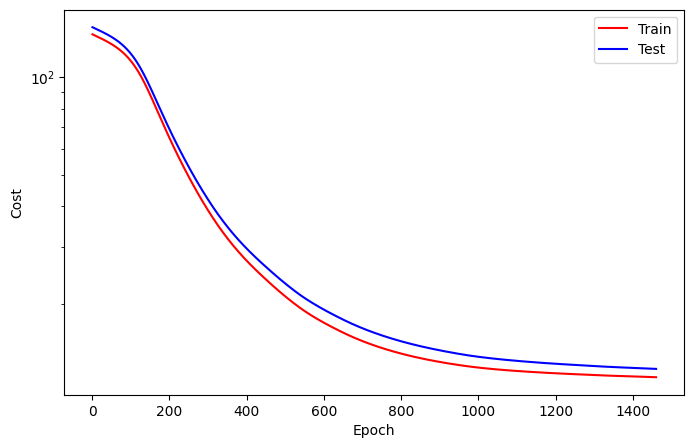

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1461
Train_cost  = 11.9093 | Test_cost  = 12.6338 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1462
Train_cost  = 11.9080 | Test_cost  = 12.6322 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1463
Train_cost  = 11.9068 | Test_cost  = 12.6305 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1464
Train_cost  = 11.9055 | Test_cost  = 12.6289 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1465
Train_cost  = 11.9042 | Test_cost  = 12.6272 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1466
Train_cost  = 11.9029 | Test_cost  = 12.6256 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1467
Train_cost  = 11.9016 | Test_cost  = 12.6239 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1468
Train_cost  = 11.9002 | Test_cost  = 12.6222 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1469
Train_cost  = 11.8989 | Test_cost  = 12.6205 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1470
Train_cost  = 11.8976 | Test_cost  = 12.6188 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1471
Train_cost  = 11.8962 | Test_cost  = 12.6171 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1472
Train_cost  = 11.8949 | Test_cost  = 12.6154 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1473
Train_cost  = 11.8935 | Test_cost  = 12.6137 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1474
Train_cost  = 11.8921 | Test_cost  = 12.6119 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1475
Train_cost  = 11.8907 | Test_cost  = 12.6102 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1476
Train_cost  = 11.8893 | Test_cost  = 12.6084 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1477
Train_cost  = 11.8879 | Test_cost  = 12.6066 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1478
Train_cost  = 11.8865 | Test_cost  = 12.6049 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1479
Train_cost  = 11.8851 | Test_cost  = 12.6031 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1480
Train_cost  = 11.8836 | Test_cost  = 12.6013 | 


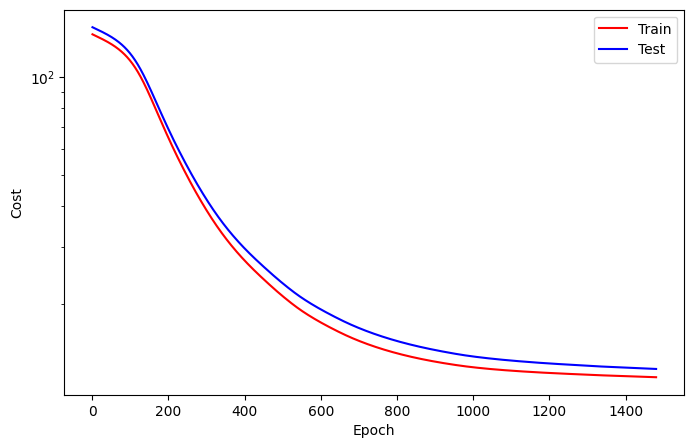

Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1481
Train_cost  = 11.8822 | Test_cost  = 12.5994 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1482
Train_cost  = 11.8807 | Test_cost  = 12.5976 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1483
Train_cost  = 11.8792 | Test_cost  = 12.5958 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1484
Train_cost  = 11.8777 | Test_cost  = 12.5939 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1485
Train_cost  = 11.8762 | Test_cost  = 12.5920 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1486
Train_cost  = 11.8747 | Test_cost  = 12.5902 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1487
Train_cost  = 11.8731 | Test_cost  = 12.5883 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1488
Train_cost  = 11.8716 | Test_cost  = 12.5863 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1489
Train_cost  = 11.8700 | Test_cost  = 12.5844 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1490
Train_cost  = 11.8684 | Test_cost  = 12.5825 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1491
Train_cost  = 11.8669 | Test_cost  = 12.5805 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1492
Train_cost  = 11.8652 | Test_cost  = 12.5785 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1493
Train_cost  = 11.8636 | Test_cost  = 12.5765 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1494
Train_cost  = 11.8620 | Test_cost  = 12.5745 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1495
Train_cost  = 11.8603 | Test_cost  = 12.5725 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1496
Train_cost  = 11.8587 | Test_cost  = 12.5704 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1497
Train_cost  = 11.8570 | Test_cost  = 12.5683 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1498
Train_cost  = 11.8553 | Test_cost  = 12.5662 | 


Train:   0%|          | 0/1 [00:00<?, ?it/s]

Test:   0%|          | 0/1 [00:00<?, ?it/s]


Epoch  1499
Train_cost  = 11.8536 | Test_cost  = 12.5641 | 


In [ ]:
while True:
    train_cost = loop_fn("train", train_set, trainloader, model, criterion, optimizer, device)
    with torch.no_grad():
        test_cost = loop_fn("test", test_set, testloader, model, criterion, optimizer, device)

    # Logging
    callback.log(train_cost, test_cost)

    # Checkpoint
    callback.save_checkpoint()

    # Runtime Plotting
    callback.cost_runtime_plotting()

    # Early Stopping
    if callback.early_stopping(model, monitor="test_cost"):
        callback.plot_cost()
        break

# Sanity Check

In [ ]:
from luwiji.rnn import illustration

In [ ]:
illustration.forecast

In [ ]:
def data4pred(model, dataset, dataloader, device):
    preds, targets = [], []
    hidden = None
    with torch.no_grad():
        model.eval()
        for inputs, target in dataloader:
            inputs = inputs.to(device)

            output, hidden = model(inputs, hidden)
            preds += output.flatten().tolist()
            targets += target.flatten().tolist()

    plt.plot(dataset.target_ticks, targets, 'b-', label="data")
    plt.plot(dataset.target_ticks, preds, 'r-', label="pred")
    plt.legend()

def pred4pred(model, dataset, dataloader, device, n_prior=75, n_forecast=30):
    preds, targets = [], []
    hidden = None
    end = n_prior + n_forecast
    with torch.no_grad():
        model.eval()
        for idx, (inputs, target) in enumerate(dataloader):
            if idx == end:
                break
            elif idx > n_prior:
                inputs[0, 0, 0] = preds[-1]

            inputs = inputs.to(device)
            output, hidden = model(inputs, hidden)

            if idx > n_prior:
                preds.append(output.flatten().tolist()[-1])
            else:
                preds += output.flatten().tolist()
            targets += target.flatten().tolist()

    plt.plot(dataset.target_ticks[:n_prior], targets[:n_prior], 'b-', label="history_data")
    plt.plot(dataset.target_ticks[n_prior:end], targets[n_prior:], 'b-', label="unseen_data", alpha=0.3)
    plt.plot(dataset.target_ticks[:end], preds, 'r-', label="prediction")
    plt.axvline(dataset.target_ticks[n_prior], color='k', linestyle="--", linewidth=1)
    plt.legend()

In [ ]:
train_forecast_set = TimeSeriesDataset(ts_train,"Temp",1)
trainforecastloader = DataLoader(train_forecast_set)

test_forecast_set = TimeSeriesDataset(ts_test,"Temp",1)
testforecastloader = DataLoader(test_forecast_set)

In [ ]:
plt.figure(figsize=(15,10))

plt.subplot(211)
data4pred(model, train_forecast_set, trainforecastloader, device)
plt.title("Train")


plt.subplot(212)
data4pred(model, test_forecast_set, testforecastloader, device)
plt.title("Test")

In [ ]:
plt.figure(figsize=(15,5))
pred4pred(model, test_forecast_set, testforecastloader, device)
plt.title("test")

In [ ]:
plt.figure(figsize=(15,5))
pred4pred(model, test_forecast_set, testforecastloader, device)
plt.title("test")